In [1]:
.libPaths("~/R/x86_64-pc-linux-gnu-library/4.4/")

library(Seurat)
library(SeuratDisk)
library(patchwork)
library(harmony)
library(reshape2)
library(RColorBrewer)
library(dplyr)
library(readr)
library(tidyverse)
library(Matrix)
library(Seurat)
library(ggplot2)
library(cowplot)
library(celldex)
library(SingleR)
library(data.table)
library(scGate)
library(ggpubr)
library(scCustomize)

ggtheme <- function() {
  theme(
    axis.text = element_text(size = 20),
    axis.title = element_text(size = 20),
    text = element_text(size = 20, colour = "black"),
    legend.text = element_text(size = 20),
    legend.key.size =  unit(10, units = "points")
    
  )
}


Loading required package: SeuratObject

Loading required package: sp

‘SeuratObject’ was built under R 4.5.0 but the current version is
4.5.1; it is recomended that you reinstall ‘SeuratObject’ as the ABI
for R may have changed

‘SeuratObject’ was built with package ‘Matrix’ 1.7.3 but the current
version is 1.7.4; it is recomended that you reinstall ‘SeuratObject’ as
the ABI for ‘Matrix’ may have changed


Attaching package: ‘SeuratObject’


The following objects are masked from ‘package:base’:

    intersect, t


Registered S3 method overwritten by 'SeuratDisk':
  method            from  
  as.sparse.H5Group Seurat

Loading required package: Rcpp


Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union


── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ forcats   1.0.0     ✔ stringr   1.5.1
✔ ggplot2   3.5.2    

# Analysis of 5p data

## Integration of CD4 and CD8 datasets

In [2]:
cd4  <- readRDS("data/cdn/gut_5p_integrated_cd4_prolif_filt.rds")
cd8  <- readRDS("data/cdn/gut_5p_integrated_CD8_with_prolif.rds")

In [3]:
library(STACAS)

In [4]:
cd8$orig_cluster  <- cd8$seurat_clusters

In [6]:
gut_t  <- merge(cd4, cd8)

Warning message:
“Some cell names are duplicated across objects provided. Renaming to enforce unique cell names.”


In [7]:
rm(cd4)
rm(cd8)

In [8]:
gut_t  <- SplitObject(gut_t, split.by = "participant_id")

# normalize and identify variable features for each dataset independently
gut_t <- lapply(X = gut_t, FUN = function(x) {
    DefaultAssay(x)  <- "RNA"
    x$barcode  <- colnames(x)
    x <- NormalizeData(x)
    x <- FindVariableFeatures(x, selection.method = "vst", nfeatures = 1200)
})


gut_allt_integrated <- Run.STACAS(gut_t, dims = 1:20)
gut_allt_integrated <- RunUMAP(gut_allt_integrated, dims = 1:20) 
DimPlot(gut_allt_integrated)
saveRDS(gut_allt_integrated, "data/gut_allt_5p_integrated.rds")


RNA3 assay doesn't leave any cells, so it is removed

Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 1.5 GiB”
Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 1.1 GiB”
Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 1.1 GiB”
Preparing PCA embeddings for objects...



In [1]:
rm(list = ls())

In [2]:
gut_allt_integrated <- readRDS("data/cdn/gut_allt_5p_integrated.rds")

In [255]:
gut_allt_integrated@assays$RNA

Assay data with 36601 features for 588063 cells
First 10 features:
 MIR1302-2HG, FAM138A, OR4F5, AL627309.1, AL627309.3, AL627309.2,
AL627309.5, AL627309.4, AP006222.2, AL732372.1 

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



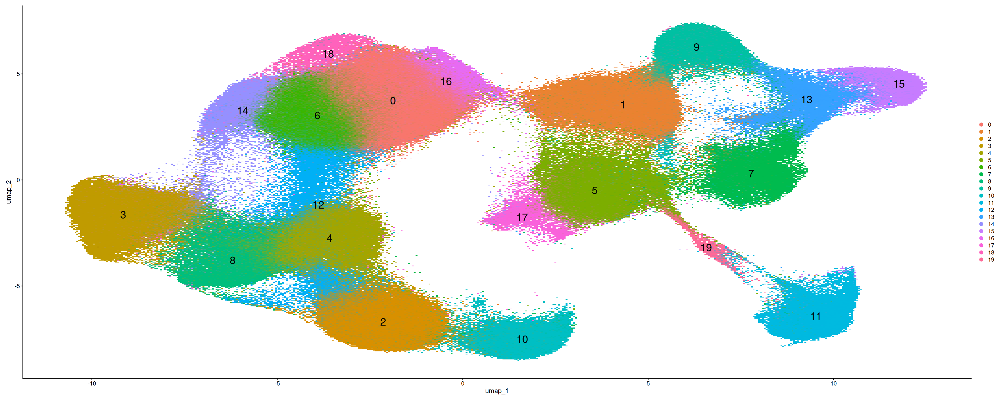

In [17]:
DimPlot(gut_allt_integrated, label = T, label.size = 8)

In [253]:
gut_allt_integrated  <- FindClusters(gut_allt_integrated, res = 0.25)

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 588063
Number of edges: 13479680

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9461
Number of communities: 11
Elapsed time: 918 seconds


In [ ]:
DimPlot(gut_allt_integrated, label = T, label.size = 8, group.by = "integrated_snn_res.0.3")

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



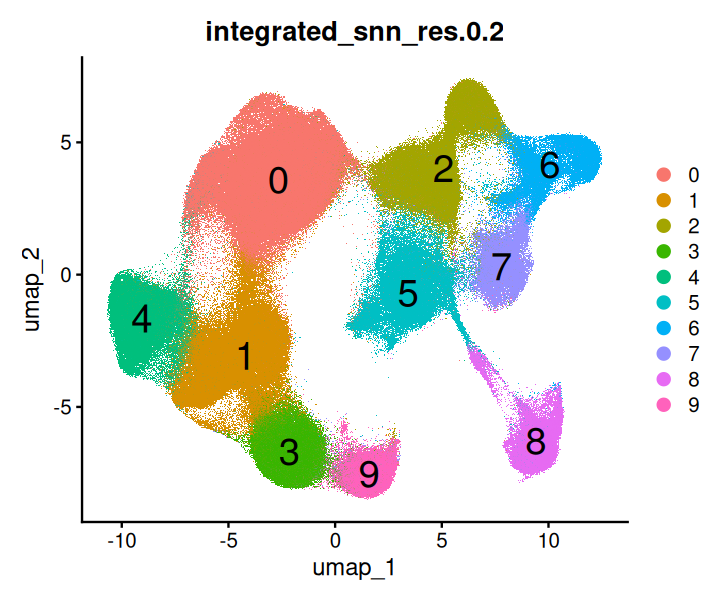

In [252]:
DimPlot(gut_allt_integrated, label = T, label.size = 8, group.by = "integrated_snn_res.0.2")

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



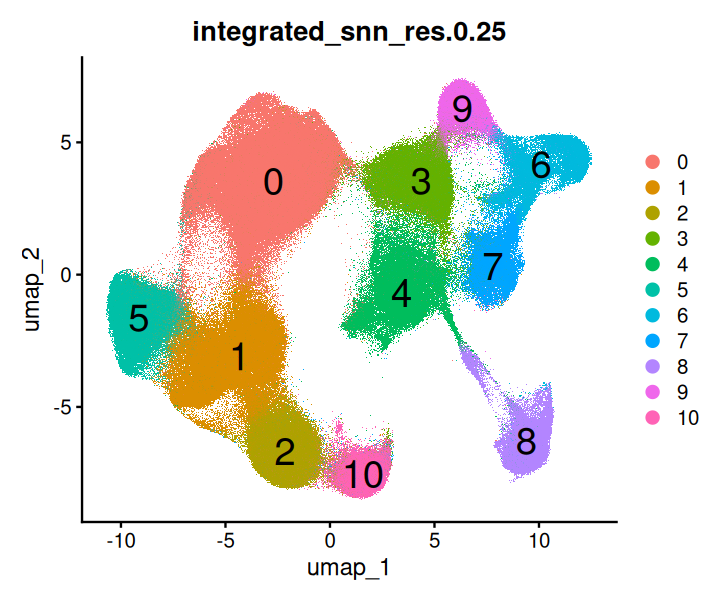

In [254]:
DimPlot(gut_allt_integrated, label = T, label.size = 8, group.by = "integrated_snn_res.0.25")

Warning message:
“Could not find CD3D in the default search locations, found in ‘RNA’ assay instead”
Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



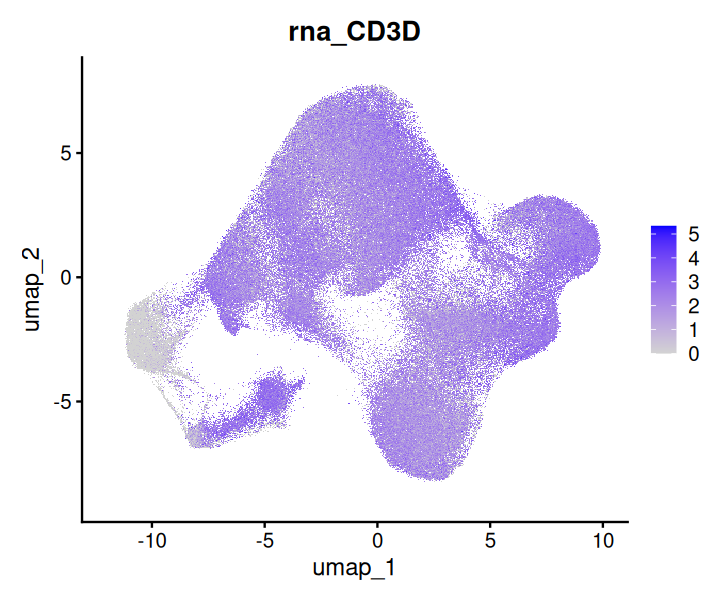

In [255]:
FeaturePlot(gut_3p_integrated, features = "CD3D")

Warning message:
“Could not find NCR1 in the default search locations, found in ‘RNA’ assay instead”
Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



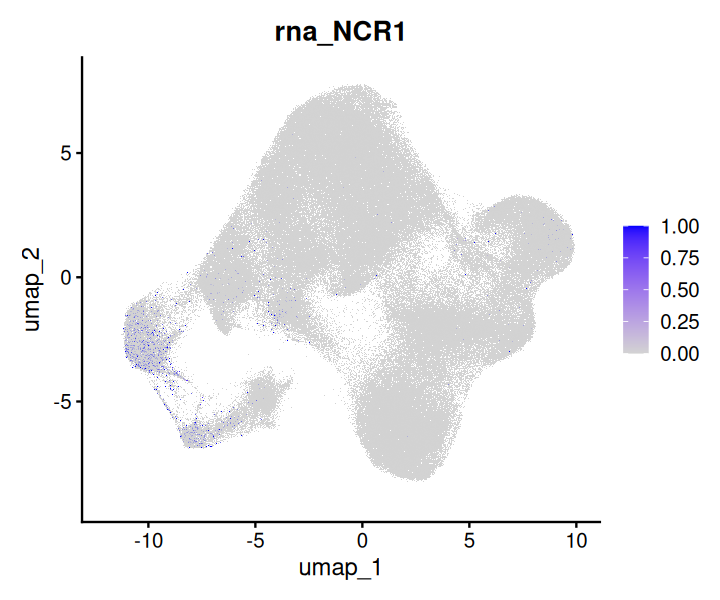

In [257]:
FeaturePlot(gut_3p_integrated, features = "NCR1", max.cutoff = 1)

## PCT expressing cells in cluster

In [243]:
pct_expressing_boxplot  <- function(seurat_object, gene, group.by = "annotations_l1", sample.col = "sample"){
   rn = which(rownames(seurat_object@assays$RNA)==gene)
ggtheme = function() {
  theme(
    axis.text = element_text(size = 20),
    axis.title = element_text(size = 20),
    text = element_text(size = 20, colour = "black"),
    legend.text = element_text(size = 20),
    legend.key.size =  unit(10, units = "points")
    
  )
}

df = data.frame(grouping_var = seurat_object@meta.data[[group.by]],
               value = seurat_object@assays$RNA@counts[rn,], 
               sample = seurat_object@meta.data[[sample.col]])  %>% 
mutate(expressing = if_else(value>0,1,0))  %>% 
dplyr::select(-value)  %>% 
group_by(sample, grouping_var)  %>% 
summarise(mean_expression = mean(expressing))  %>% 
pivot_wider(names_from = sample, values_from = mean_expression, values_fill = 0)  %>% 
pivot_longer(!grouping_var, names_to = "sample", values_to = "expressing")

plt = ggplot(data = df, aes(x = grouping_var, y = expressing)) +
geom_boxplot(outlier.shape = NA, aes(fill = grouping_var), alpha = 0.3) + 
  geom_dotplot(binaxis='y', stackdir='center', dotsize=0) + 
  geom_jitter(width = 0.1, height = 0.0, size = 2, aes(color = grouping_var)) +
theme_classic() +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5)) +
ggtheme() +
xlab("") + NoLegend()
    return(plt)
    }


`summarise()` has grouped output by 'sample'. You can override using the
`.groups` argument.
Bin width defaults to 1/30 of the range of the data. Pick better value with
`binwidth`.


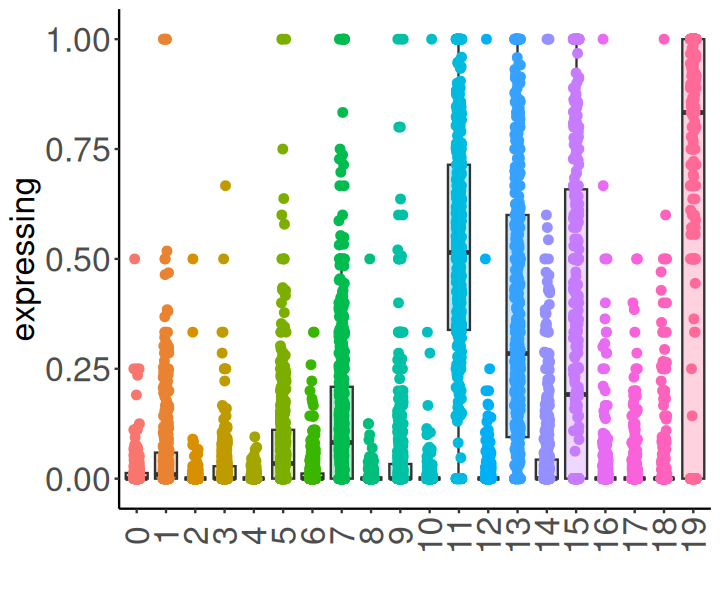

In [245]:
pct_expressing_boxplot(gut_allt_integrated, "GNLY", group.by = "seurat_clusters",sample.col = "data_folder")

`summarise()` has grouped output by 'sample'. You can override using the
`.groups` argument.
Bin width defaults to 1/30 of the range of the data. Pick better value with
`binwidth`.


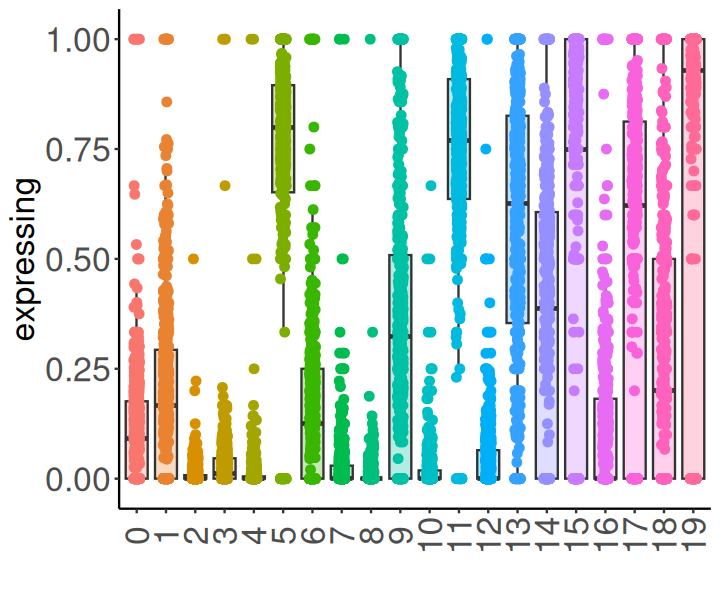

In [246]:
pct_expressing_boxplot(gut_allt_integrated, "GZMA", group.by = "seurat_clusters",sample.col = "data_folder")

`summarise()` has grouped output by 'sample'. You can override using the
`.groups` argument.
Bin width defaults to 1/30 of the range of the data. Pick better value with
`binwidth`.


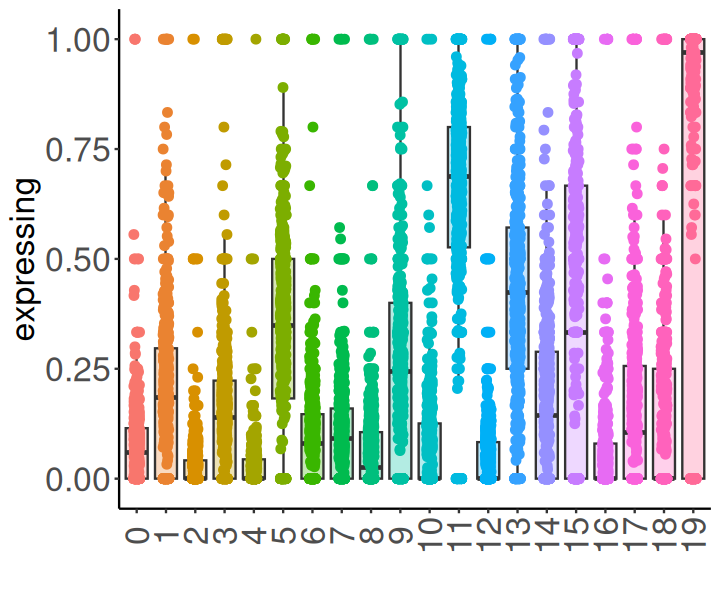

In [248]:
pct_expressing_boxplot(gut_allt_integrated, "PRF1", group.by = "seurat_clusters",sample.col = "data_folder")

`summarise()` has grouped output by 'sample'. You can override using the
`.groups` argument.
Bin width defaults to 1/30 of the range of the data. Pick better value with
`binwidth`.


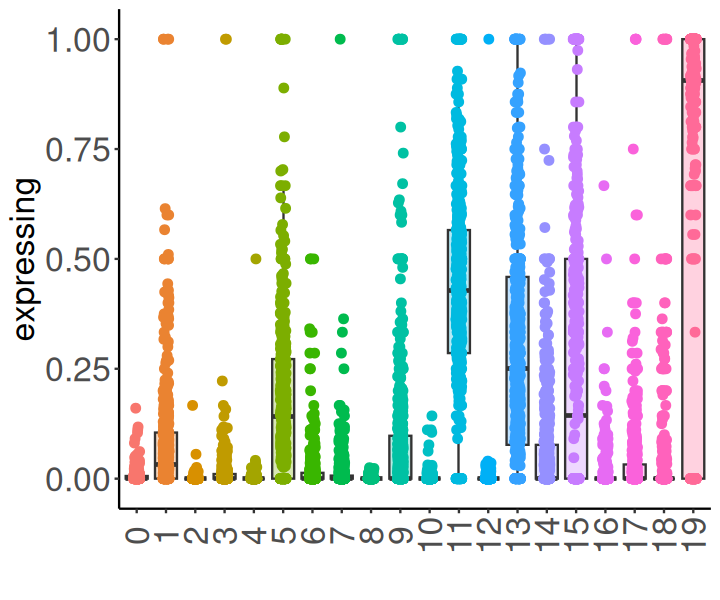

In [247]:
pct_expressing_boxplot(gut_allt_integrated, "GZMB", group.by = "seurat_clusters",sample.col = "data_folder")

In [5]:
ls()

[1] "ggtheme"             "gut_allt_integrated"

In [6]:
rm(gut_allt_integrated)

In [ ]:
pct_expressing_boxplot(gut_allt_integrated, "CD8A", group.by = "seurat_clusters",sample.col = "data_folder")

`summarise()` has grouped output by 'sample'. You can override using the
`.groups` argument.
Bin width defaults to 1/30 of the range of the data. Pick better value with
`binwidth`.


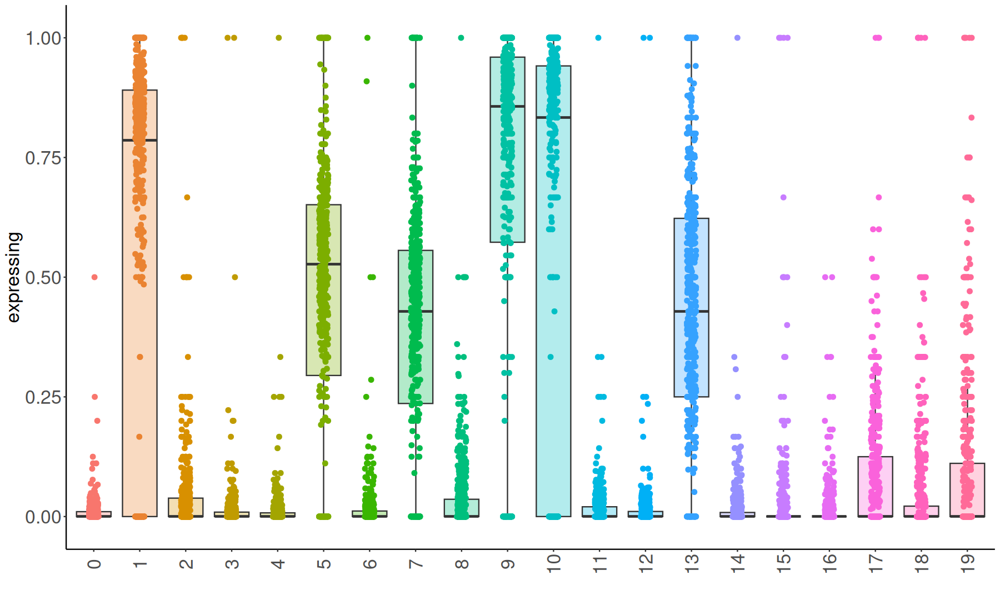

In [54]:
pct_expressing_boxplot(gut_allt_integrated, "CD8B", group.by = "seurat_clusters",sample.col = "data_folder")

`summarise()` has grouped output by 'sample'. You can override using the
`.groups` argument.
Bin width defaults to 1/30 of the range of the data. Pick better value with
`binwidth`.


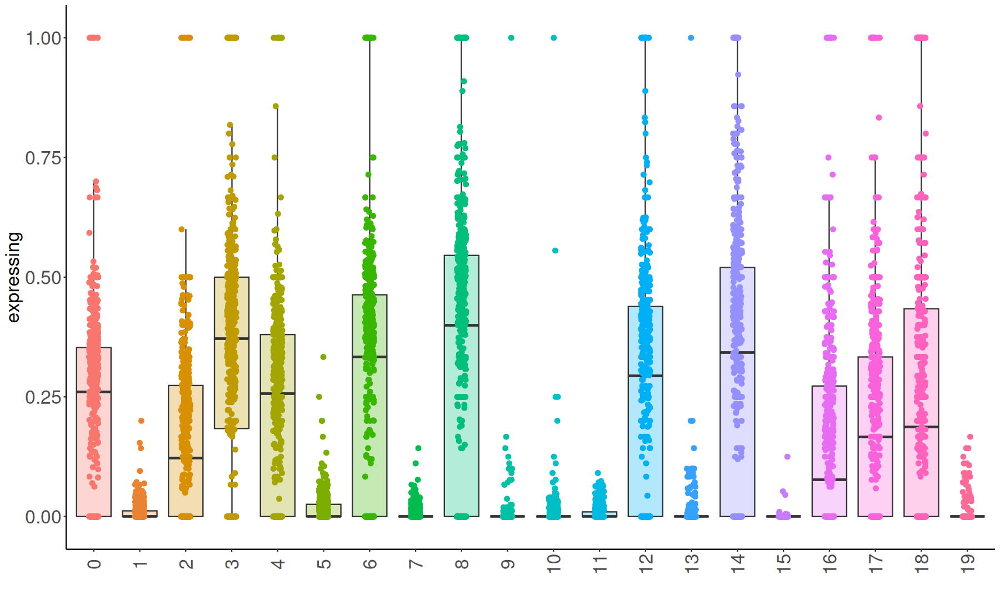

In [55]:
pct_expressing_boxplot(gut_allt_integrated, "CD4", group.by = "seurat_clusters",sample.col = "data_folder")

In [ ]:
FeaturePlot(gut_allt_integrated, label = T, features = c("CD8A","CD4","CD3D","NCR1"), min.cutoff = 0)

In [5]:
all.equal(Idents(gut_allt_integrated), gut_allt_integrated$seurat_clusters)

[1] TRUE

## Cluster composition

In [34]:
md <- gut_allt_integrated@meta.data
df4 <- md %>% group_by(data_folder, seurat_clusters) %>% 
  summarise(n = n()) %>% 
  unique() %>% 
  mutate(freq = n / sum(n))  %>%
dplyr::select(-n)  %>% 
pivot_wider(names_from = seurat_clusters, values_from = freq, values_fill = 0)  %>% 
pivot_longer(!data_folder, names_to = "seurat_clusters", values_to = "freq")

# As we've lost non-grouping variables, let's join them back
md_to_join <- md %>% dplyr::select(diagnosis, antitnf_response, 
                                   timepoint, tissue, layer, data_folder, participant_id) %>% unique()
df4  <- left_join(df4, md_to_join, by = "data_folder")


`summarise()` has grouped output by 'data_folder'. You can override using the
`.groups` argument.


Warning message:
“Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead.”


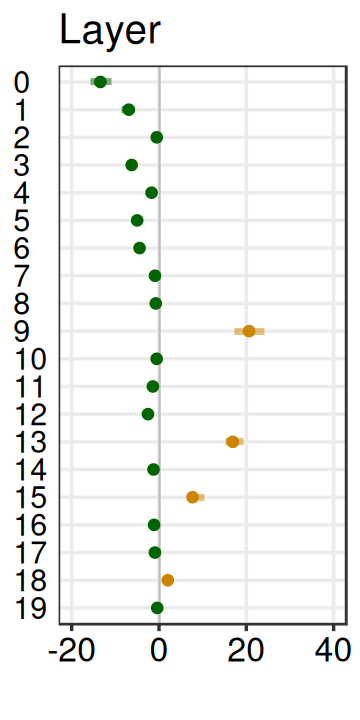

In [35]:

stat_test <- df4 %>%
mutate(freq100 = freq*100)  %>% 
  group_by(seurat_clusters) %>%
  rstatix::wilcox_test(freq100 ~ layer, detailed = TRUE) 

options(repr.plot.width = 3, repr.plot.height = 6)

stat_test %>%
  mutate(upper = conf.high,
         lower = conf.low) %>%
  #mutate(across(all_of(c(
  #  "estimate", "lower", "upper"
  #)), exp)) %>%
  mutate(upper = ifelse(upper > 75, 74.9999, upper)) %>%
  mutate(lower = ifelse(lower < -25, -24.9999, lower)) %>%
  arrange(seurat_clusters) %>%
  ggplot(aes(estimate, factor(seurat_clusters, levels = 19:0), 
             color = ifelse(p*11>0.05,"1",ifelse(estimate > 1,"2","3")))) +
  geom_vline(xintercept = 0, color = "gray75") +
  geom_linerange(aes(xmin = lower, xmax = upper),
                 size = 1.5,
                 alpha = 0.5) +
  geom_point(size = 2.5) +
  theme_bw(base_size = 16) +
  scale_color_manual(values = c("3" = "darkgreen", "1" = "grey70","2" = "orange3"), guide = "none") +
  xlim(c(-20, 40)) +
  labs(title = "Layer", y = NULL,
       x = "") +
    theme(axis.text.y = element_text(hjust = 0, size = 18),
        panel.grid.minor = element_blank(), 
        axis.ticks.y = element_blank(), 
                axis.text = element_text(color = "black")) + ggtheme()


Scale for y is already present.
Adding another scale for y, which will replace the existing scale.
Warning message in wilcox.test.default(c(33.5191637630662, 3.21769733534439, 37.5231053604436, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(1.46341463414634, 3.46907993966818, 0.646950092421442, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(1.46341463414634, 3.46907993966818, 0.646950092421442, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(1.46341463414634, 3.46907993966818, 0.646950092421442, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0.418118466898955, 3.21769733534439, 3.3271719038817, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0.696864111498258, 9.4017094017094, 2.03327171903882, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0.0502765208647562, 0.1848

Warning message in wilcox.test.default(c(0.5380476556495, 1.42226581657675, 0.521415270018622, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(1.12733794517038, 0.490436488474743, 5.25139664804469, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(1.12733794517038, 0.490436488474743, 5.25139664804469, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(1.12733794517038, 0.490436488474743, 5.25139664804469, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(2.51088905969767, 0.392349190779794, 2.12290502793296, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(2.51088905969767, 0.392349190779794, 2.12290502793296, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0.0256213169356905, 0.147130946542423, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0.0

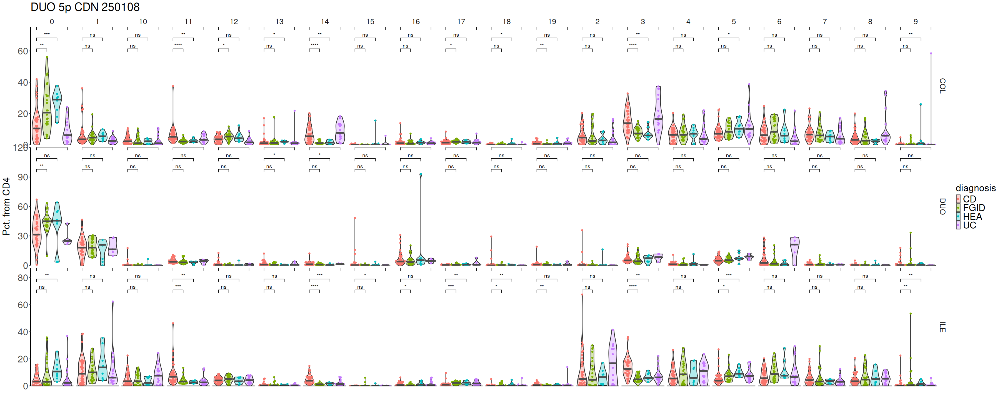

In [192]:
options(repr.plot.width = 30, repr.plot.height = 12)
df_filt <- df4 %>% 
dplyr::filter(diagnosis %in% c("UC","CD","FGID","HEA") & timepoint == "T0" & layer == "LP")

stat_test <- df_filt %>%
mutate(freq100 = freq*100)  %>% 
  group_by(seurat_clusters) %>%
  rstatix::wilcox_test(freq100 ~ diagnosis, ref.group = "all") %>%
  mutate(p.label = ifelse(p < 0.001, "< 0.001", round(p, 3))) %>%
  rstatix::add_y_position() 

df_filt  %>% 
ggplot(aes(x = diagnosis, y = freq*100)) + # you can change the x to whatever variable you're interested in
   geom_violin(alpha = 0.3, aes(fill = diagnosis), scale = "width") + 
 
ggbeeswarm::geom_beeswarm(size = 1.5, aes(color = diagnosis), cex = 2, 
                shape = 16, corral = "random") +
 stat_summary(fun = "median",
               geom = "crossbar", 
               width = 0.75,
               color = "grey30") +
  facet_grid(cols = vars(seurat_clusters),
             rows = vars(tissue), 
             scales = "free") +
  ylab("Pct. from CD4") +
  xlab("") +
  ylim(c(0,NA)) + # This ensures that our x axis starts at zero, but feel free to remove this line
  scale_y_continuous(expand = c(NA,40))+
  theme_classic() +
  theme(strip.background = element_blank(), 
        panel.grid = element_blank(),
        axis.ticks.x = element_blank(),
        axis.text.x = element_blank()) + ggtitle(label = "DUO 5p CDN 250108") +
ggpubr::stat_compare_means(comparisons = list(c(1,2),c(1,3),c(1,4)), label = "p.signif") +#stat_pvalue_manual(
#    stat_test, label = "p.adj.signif", 
#    #y.position = 35,
#    remove.bracket = TRUE
#    ) + 
ggtheme()

In [194]:
# Adding pseudocount
pseudo_count <- 1e-4
df4 <- df4  %>% mutate(freq = if_else(freq == 0, 0.0001, as.numeric(freq)))


df_proportions <- md %>% group_by(data_folder, seurat_clusters) %>% 
  summarise(n = n()) %>% 
  unique() %>% 
  mutate(freq = n / sum(n))  %>%
dplyr::select(-n)  %>% 
pivot_wider(names_from = seurat_clusters, values_from = freq, values_fill = 0.0001)  %>% 
column_to_rownames("data_folder")

df_proportions


geom_mean <- function(x) exp(mean(log(x)))

clr_transform <- function(x){
  log(x / geom_mean(x))
}

clr_df <- t(apply(df_proportions, 1, clr_transform))
clr_df <- as.data.frame(clr_df)



clr_df

colnames(clr_df)  <- paste0("cluster",colnames(clr_df))

clr_df2  <- clr_df  %>% rownames_to_column("data_folder")  %>% left_join(md_to_join, by = "data_folder")

clr_df2

`summarise()` has grouped output by 'data_folder'. You can override using the
`.groups` argument.


,0,1,3,4,5,7,11,13,14,16,17,19,6,8,9,15,2,10,12,18
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
001-017_T0_DUO_LP_5p_GEX,0.3478024959,0.2344004341,0.046120456,0.0005425936,0.103635377,0.003798155,0.042864894,0.002170374,0.0010851872,0.20401519,0.001627781,0.0119370591,0.000100000,0.0001000000,0.0001000000,0.0001000000,0.0001000000,0.0001000000,0.0001000000,0.0001000000
001-023_T0_DUO_LP_5p_GEX,0.4129692833,0.2354948805,0.179180887,0.0170648464,0.040955631,0.001706485,0.040955631,0.000100000,0.0085324232,0.04095563,0.008532423,0.0051194539,0.001706485,0.0017064846,0.0017064846,0.0034129693,0.0001000000,0.0001000000,0.0001000000,0.0001000000
001-028_T0_DUO_LP_5p_GEX,0.4494331066,0.1342403628,0.037641723,0.0081632653,0.089342404,0.004081633,0.020408163,0.013151927,0.0099773243,0.02857143,0.014058957,0.0054421769,0.158730159,0.0009070295,0.0031746032,0.0004535147,0.0004535147,0.0004535147,0.0172335601,0.0040816327
001-030_T0_DUO_LP_5p_GEX,0.4005763689,0.3069164265,0.023054755,0.0057636888,0.073487032,0.048991354,0.028818444,0.010086455,0.0144092219,0.01296830,0.007204611,0.0043227666,0.040345821,0.0014409222,0.0086455331,0.0057636888,0.0028818444,0.0014409222,0.0014409222,0.0014409222
001-033_T0_DUO_LP_5p_GEX,0.4485981308,0.2603471295,0.054739653,0.0040053405,0.087449933,0.002670227,0.024699599,0.001335113,0.0073431242,0.03271028,0.004005340,0.0053404539,0.060747664,0.0013351135,0.0020026702,0.0001000000,0.0006675567,0.0006675567,0.0006675567,0.0006675567
001-034_T0_DUO_LP_5p_GEX,0.5456475584,0.1974522293,0.012738854,0.0021231423,0.029723992,0.008492569,0.014861996,0.000100000,0.0001000000,0.14437367,0.004246285,0.0042462845,0.000100000,0.0001000000,0.0254777070,0.0021231423,0.0021231423,0.0001000000,0.0042462845,0.0021231423
001-035_T0_DUO_EPI_5p_GEX,0.6349306431,0.1469104666,0.034678436,0.0119798235,0.038461538,0.012610340,0.017023960,0.000630517,0.0050441362,0.04098361,0.002522068,0.0050441362,0.032156368,0.0006305170,0.0037831021,0.0006305170,0.0044136192,0.0006305170,0.0063051702,0.0006305170
001-035_T0_DUO_LP_5p_GEX,0.6345536288,0.1483622351,0.032113038,0.0166987797,0.036608863,0.008991651,0.017341040,0.002569043,0.0032113038,0.06101477,0.003853565,0.0057803468,0.011560694,0.0012845215,0.0057803468,0.0001000000,0.0032113038,0.0006422608,0.0038535645,0.0025690430
001-043_T0_DUO_LP_5p_GEX,0.5777610819,0.1577761082,0.036063110,0.0030052592,0.048084147,0.000100000,0.033057851,0.001502630,0.0007513148,0.12171300,0.005259204,0.0037565740,0.000100000,0.0001000000,0.0007513148,0.0060105184,0.0015026296,0.0015026296,0.0001000000,0.0015026296


,0,1,3,4,5,7,11,13,14,16,17,19,6,8,9,15,2,10,12,18
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
001-017_T0_DUO_LP_5p_GEX,5.10248446,4.70788060,3.0821063,-1.36054499,3.8917284,0.5853652,3.0089029,0.02574937,-0.66739781,4.56904415,-0.26193270,1.73049746,-3.0517354,-3.0517354,-3.05173541,-3.05173541,-3.0517354,-3.05173541,-3.05173541,-3.0517354
001-023_T0_DUO_LP_5p_GEX,4.60231619,4.04063215,3.7673388,1.41596356,2.2914323,-0.8866215,2.2914323,-3.72364212,0.72281638,2.29143229,0.72281638,0.21199075,-0.8866215,-0.8866215,-0.88662154,-0.19347436,-3.7236421,-3.72364212,-3.72364212,-3.7236421
001-028_T0_DUO_LP_5p_GEX,3.79683727,2.58848219,1.3169633,-0.21150550,2.1813265,-0.9046527,0.7047852,0.26541857,-0.01083481,1.04125746,0.33210994,-0.61697061,2.7560559,-2.4087301,-1.15596711,-3.10187726,-3.1018773,-3.10187726,0.53570890,-0.9046527
001-030_T0_DUO_LP_5p_GEX,3.52967660,3.26334765,0.6746442,-0.71165016,1.8338811,1.4284160,0.8977878,-0.15203437,0.20464058,0.09928006,-0.48850660,-0.99933223,1.2342600,-2.0979445,-0.30618505,-0.71165016,-1.4047973,-2.09794452,-2.09794452,-2.0979445
001-033_T0_DUO_LP_5p_GEX,4.31998224,3.77587064,2.2164432,-0.39851663,2.6849212,-0.8039817,1.4206418,-1.49712892,0.20761918,1.70154420,-0.39851663,-0.11083455,2.3205834,-1.4971289,-1.09166381,-4.08873030,-2.1902761,-2.19027610,-2.19027610,-2.1902761
001-034_T0_DUO_LP_5p_GEX,4.98151902,3.96504242,1.2242024,-0.56755707,2.0715003,0.8187373,1.3783531,-3.62303935,-3.62303935,3.65195064,0.12559011,0.12559011,-3.6230393,-3.6230393,1.91734958,-0.56755707,-0.5675571,-3.62303935,0.12559011,-0.5675571
001-035_T0_DUO_EPI_5p_GEX,4.44414941,2.98045697,1.5367517,0.47385750,1.6402924,0.5251508,0.8252554,-2.47058148,-0.39113994,1.70380579,-1.08428712,-0.39113994,1.4612442,-2.4705815,-0.67882201,-2.47058148,-0.5246713,-2.47058148,-0.16799639,-2.4705815
001-035_T0_DUO_LP_5p_GEX,4.40902421,2.95575923,1.4253645,0.77143805,1.5563928,0.1523988,0.8091784,-1.10036412,-0.87722057,2.06721841,-0.69489902,-0.28943391,0.4037133,-1.7935113,-0.28943391,-4.34648268,-0.8772206,-2.48665848,-0.69489902,-1.1003641
001-043_T0_DUO_LP_5p_GEX,5.11403482,3.81605138,2.3401449,-0.14476179,2.6278269,-3.5477107,2.2531335,-0.83790897,-1.53105615,3.55654018,0.41485400,0.07838176,-3.5477107,-3.5477107,-1.53105615,0.54838539,-0.8379090,-0.83790897,-3.54771071,-0.8379090


data_folder,cluster0,cluster1,cluster3,cluster4,cluster5,cluster7,cluster11,cluster13,cluster14,⋯,cluster2,cluster10,cluster12,cluster18,diagnosis,antitnf_response,timepoint,tissue,layer,participant_id
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
001-017_T0_DUO_LP_5p_GEX,5.10248446,4.70788060,3.0821063,-1.36054499,3.8917284,0.5853652,3.0089029,0.02574937,-0.66739781,⋯,-3.0517354,-3.05173541,-3.05173541,-3.0517354,FGID,NM,T0,DUO,LP,001-017
001-023_T0_DUO_LP_5p_GEX,4.60231619,4.04063215,3.7673388,1.41596356,2.2914323,-0.8866215,2.2914323,-3.72364212,0.72281638,⋯,-3.7236421,-3.72364212,-3.72364212,-3.7236421,FGID,NM,T0,DUO,LP,001-023
001-028_T0_DUO_LP_5p_GEX,3.79683727,2.58848219,1.3169633,-0.21150550,2.1813265,-0.9046527,0.7047852,0.26541857,-0.01083481,⋯,-3.1018773,-3.10187726,0.53570890,-0.9046527,FGID,NM,T0,DUO,LP,001-028
001-030_T0_DUO_LP_5p_GEX,3.52967660,3.26334765,0.6746442,-0.71165016,1.8338811,1.4284160,0.8977878,-0.15203437,0.20464058,⋯,-1.4047973,-2.09794452,-2.09794452,-2.0979445,FGID,NM,T0,DUO,LP,001-030
001-033_T0_DUO_LP_5p_GEX,4.31998224,3.77587064,2.2164432,-0.39851663,2.6849212,-0.8039817,1.4206418,-1.49712892,0.20761918,⋯,-2.1902761,-2.19027610,-2.19027610,-2.1902761,FGID,NM,T0,DUO,LP,001-033
001-034_T0_DUO_LP_5p_GEX,4.98151902,3.96504242,1.2242024,-0.56755707,2.0715003,0.8187373,1.3783531,-3.62303935,-3.62303935,⋯,-0.5675571,-3.62303935,0.12559011,-0.5675571,FGID,NM,T0,DUO,LP,001-034
001-035_T0_DUO_EPI_5p_GEX,4.44414941,2.98045697,1.5367517,0.47385750,1.6402924,0.5251508,0.8252554,-2.47058148,-0.39113994,⋯,-0.5246713,-2.47058148,-0.16799639,-2.4705815,FGID,NM,T0,DUO,EPI,001-035
001-035_T0_DUO_LP_5p_GEX,4.40902421,2.95575923,1.4253645,0.77143805,1.5563928,0.1523988,0.8091784,-1.10036412,-0.87722057,⋯,-0.8772206,-2.48665848,-0.69489902,-1.1003641,FGID,NM,T0,DUO,LP,001-035
001-043_T0_DUO_LP_5p_GEX,5.11403482,3.81605138,2.3401449,-0.14476179,2.6278269,-3.5477107,2.2531335,-0.83790897,-1.53105615,⋯,-0.8379090,-0.83790897,-3.54771071,-0.8379090,FGID,NM,T0,DUO,LP,001-043


In [195]:
clr_df3  <- clr_df2  %>% dplyr::filter(diagnosis %in% c("CD","HEA","UC","FGID"))  %>% 
pivot_longer(cols = starts_with("cluster"), names_to = "seurat_clusters", values_to = "freq_clr")  %>% 
mutate(seurat_clusters = gsub(seurat_clusters, pattern = "cluster", replacement = ""))

In [196]:
options(repr.plot.width = 30, repr.plot.height = 12)
clr_df3_filt <- clr_df3 %>% 
dplyr::filter(diagnosis %in% c("UC","CD","FGID","HEA") & timepoint == "T0" & layer == "LP")

In [197]:
stat_test <- df_filt %>%
mutate(freq100 = freq*100)  %>% 
  group_by(seurat_clusters, tissue, layer) %>%
  rstatix::wilcox_test(freq100 ~ diagnosis, ref.group = "all", detailed = T) %>%
  mutate(p.label = ifelse(p < 0.001, "< 0.001", round(p, 3)))

In [198]:
clr_df3_filt

data_folder,diagnosis,antitnf_response,timepoint,tissue,layer,participant_id,seurat_clusters,freq_clr
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>
001-017_T0_DUO_LP_5p_GEX,FGID,NM,T0,DUO,LP,001-017,0,5.10248446
001-017_T0_DUO_LP_5p_GEX,FGID,NM,T0,DUO,LP,001-017,1,4.70788060
001-017_T0_DUO_LP_5p_GEX,FGID,NM,T0,DUO,LP,001-017,3,3.08210626
001-017_T0_DUO_LP_5p_GEX,FGID,NM,T0,DUO,LP,001-017,4,-1.36054499
001-017_T0_DUO_LP_5p_GEX,FGID,NM,T0,DUO,LP,001-017,5,3.89172844
001-017_T0_DUO_LP_5p_GEX,FGID,NM,T0,DUO,LP,001-017,7,0.58536516
001-017_T0_DUO_LP_5p_GEX,FGID,NM,T0,DUO,LP,001-017,11,3.00890286
001-017_T0_DUO_LP_5p_GEX,FGID,NM,T0,DUO,LP,001-017,13,0.02574937
001-017_T0_DUO_LP_5p_GEX,FGID,NM,T0,DUO,LP,001-017,14,-0.66739781


Scale for y is already present.
Adding another scale for y, which will replace the existing scale.


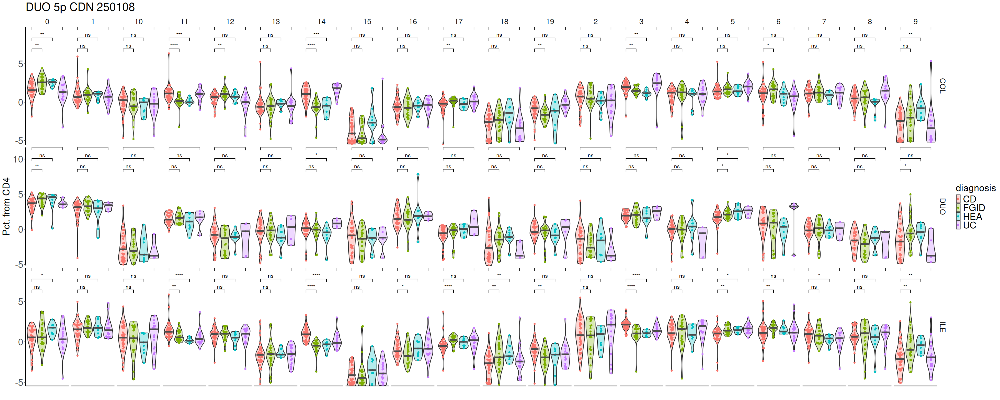

In [199]:
clr_df3_filt  %>% 
ggplot(aes(x = diagnosis, y = freq_clr)) + # you can change the x to whatever variable you're interested in
   geom_violin(alpha = 0.3, aes(fill = diagnosis), scale = "width") + 
 
ggbeeswarm::geom_beeswarm(size = 1.5, aes(color = diagnosis), cex = 2, 
                shape = 16, corral = "random") +
 stat_summary(fun = "median",
               geom = "crossbar", 
               width = 0.75,
               color = "grey30") +
  facet_grid(cols = vars(seurat_clusters),
             rows = vars(tissue), 
             scales = "free") +
  ylab("Pct. from CD4") +
  xlab("") +
  ylim(c(0,NA)) + # This ensures that our x axis starts at zero, but feel free to remove this line
  scale_y_continuous(expand = c(NA,40))+
  theme_classic() +
  theme(strip.background = element_blank(), 
        panel.grid = element_blank(),
        axis.ticks.x = element_blank(),
        axis.text.x = element_blank()) + ggtitle(label = "DUO 5p CDN 250108") +
ggpubr::stat_compare_means(comparisons = list(c(1,2),c(1,3),c(1,4)), label = "p.signif") +#stat_pvalue_manual(
#    stat_test, label = "p.adj.signif", 
#    #y.position = 35,
#    remove.bracket = TRUE
#    ) + 
ggtheme()

Warning message:
“ggrepel: 3 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


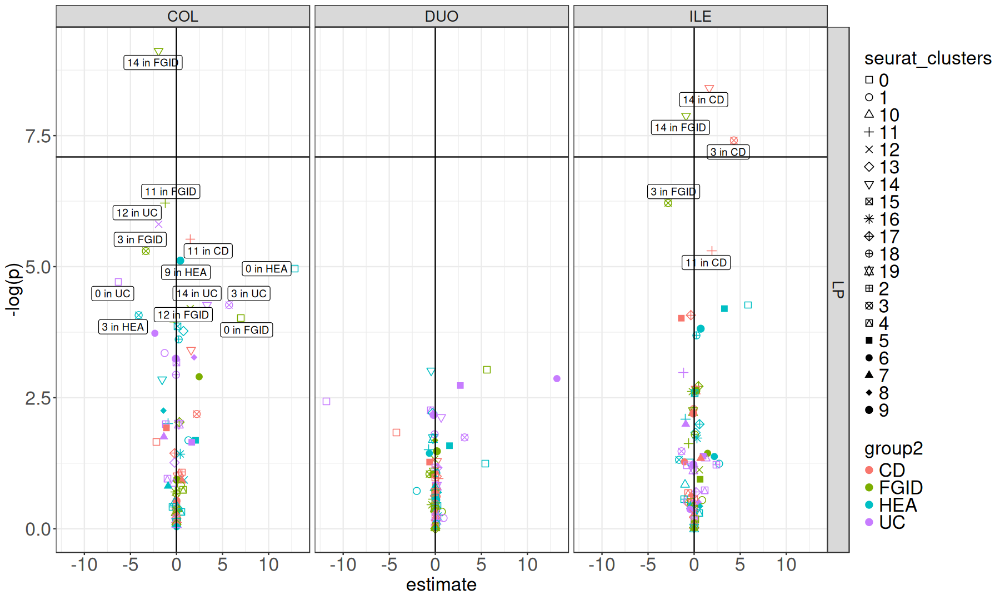

In [200]:
options(repr.plot.width = 15, repr.plot.height = 9)
stat_test  %>% arrange(p)  %>% 
mutate(estimate = -estimate)  %>% 
mutate(delabel = if_else(p.adj <0.05, paste0(seurat_clusters, " in ", group2),""))  %>% 
ggplot(aes(x = estimate, y = -log(p), label = delabel)) +
theme_bw() +
geom_point(aes(color = group2, shape = seurat_clusters), size = 3) +
        ggrepel::geom_label_repel() +
       facet_grid(cols = vars(tissue), rows = vars(layer)) +
scale_fill_manual() +
scale_shape_manual(values = c(0:20)) +
geom_hline(yintercept = -log(0.05/(60))) +
geom_vline(xintercept = 0) +
ggtheme()

In [201]:
stat_test  %>% arrange(p)

seurat_clusters,tissue,layer,estimate,.y.,group1,group2,n1,n2,statistic,p,conf.low,conf.high,method,alternative,p.adj,p.adj.signif,p.label
<chr>,<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<dbl>,<chr>,<chr>
14,COL,LP,1.9442985,freq100,all,FGID,90,24,1637.0,0.000110,0.67264973,3.624998e+00,Wilcoxon,two.sided,0.000440,***,< 0.001
14,ILE,LP,-1.6408303,freq100,all,CD,92,40,1094.0,0.000223,-2.59885607,-7.441847e-01,Wilcoxon,two.sided,0.000892,***,< 0.001
14,ILE,LP,0.8759713,freq100,all,FGID,92,24,1626.0,0.000379,0.36230880,1.747116e+00,Wilcoxon,two.sided,0.001000,**,< 0.001
3,ILE,LP,-4.3125530,freq100,all,CD,92,40,1147.0,0.000606,-6.68605795,-1.801610e+00,Wilcoxon,two.sided,0.002000,**,< 0.001
11,COL,LP,1.2316910,freq100,all,FGID,90,24,1527.0,0.002000,0.39001816,2.175236e+00,Wilcoxon,two.sided,0.008000,**,0.002
3,ILE,LP,2.8214909,freq100,all,FGID,92,24,1549.0,0.002000,0.99195695,5.275037e+00,Wilcoxon,two.sided,0.007000,**,0.002
12,COL,LP,1.9370252,freq100,all,UC,90,17,1114.5,0.003000,0.66176820,3.217755e+00,Wilcoxon,two.sided,0.012000,*,0.003
11,COL,LP,-1.4970314,freq100,all,CD,90,40,1225.0,0.004000,-2.60498995,-5.018590e-01,Wilcoxon,two.sided,0.011000,*,0.004
11,ILE,LP,-1.9137233,freq100,all,CD,92,40,1270.5,0.005000,-3.57152550,-5.285800e-01,Wilcoxon,two.sided,0.019000,*,0.005


## Annotating clusters

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



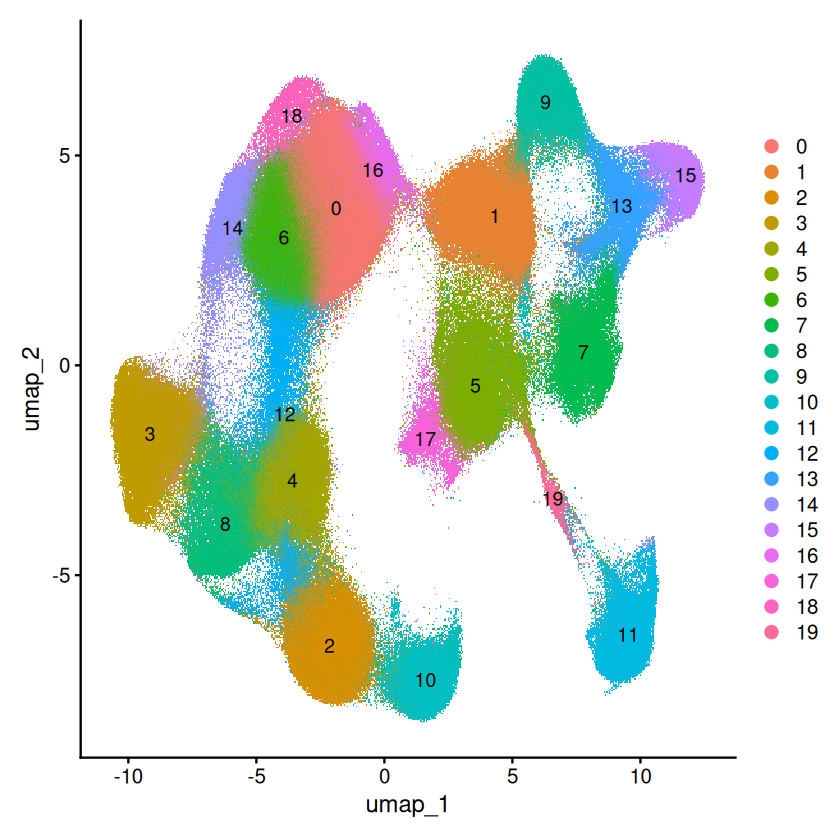

In [4]:
DimPlot(gut_allt_integrated, label = T)

In [ ]:
markers2  <- c("SELL", "CCR7", "LEF1", "TCF7", 
              "CXCR5", "GPR183", 
              "FOXP3", "IKZF2","IL2RA","TNFRSF18","CTLA4",
              "GATA3", "IL13","NEFL","PLP2","IL4", "ZBTB16",'IL5',
              "CCR6", "RORC" ,"IL17A","EOMES","IL17F","CXCR6","IL26",
              "ITGB1","S100A4","S100A6",
                   "IL23R","KLRB1","CCL5", "TBX21", "IFNG",
               "MKI67", "PCNA", "MCM6",
              "FASLG", "CST7","CCL5",'CXCR3',"CCL4",'XCL1','CD177','BATF',
               'IL22','RORA','CXCL13','IL21','GZMB',"GNLY","IL26",'PRF1',
'KLRD1','XCL1','CCL3L1','HLA-DRB5','HLA-DRA','CCL25',"TNF","CD40LG")

In [225]:
markers2  <- c("SELL", "CCR7", "LEF1", "TCF7","IL26","KLRB1")

In [241]:
DefaultAssay(gut_allt_integrated)  <- "RNA"
avgexp = AggregateExpression(gut_allt_integrated, features = markers2, group.by = "seurat_clusters", slot = "data",
                          assay = "RNA")

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



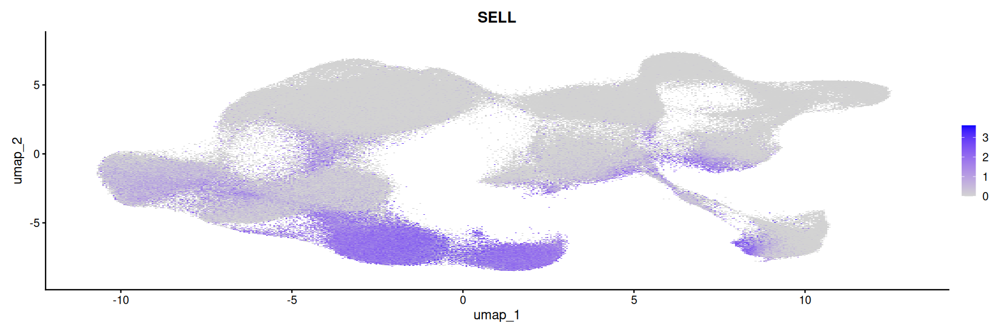

In [235]:
FeaturePlot(gut_allt_integrated, features = "SELL")

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



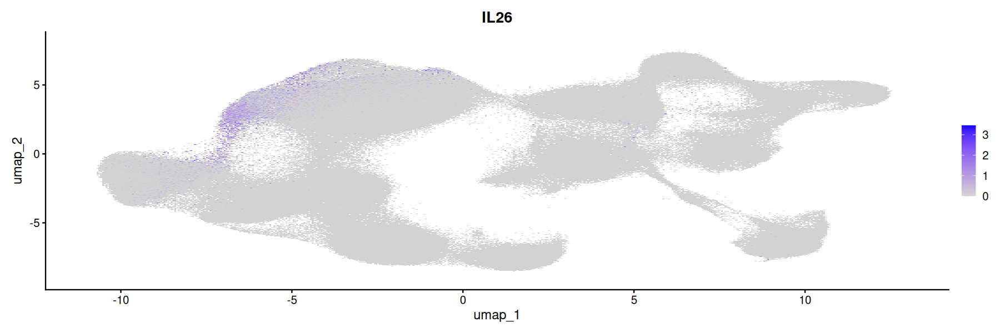

In [236]:
FeaturePlot(gut_allt_integrated, features = "IL26")

In [234]:
gut_allt_integrated

An object of class Seurat 
74202 features across 588063 samples within 3 assays 
Active assay: RNA (36601 features, 0 variable features)
 2 layers present: counts, data
 2 other assays present: integrated, RNA3
 2 dimensional reductions calculated: pca, umap

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



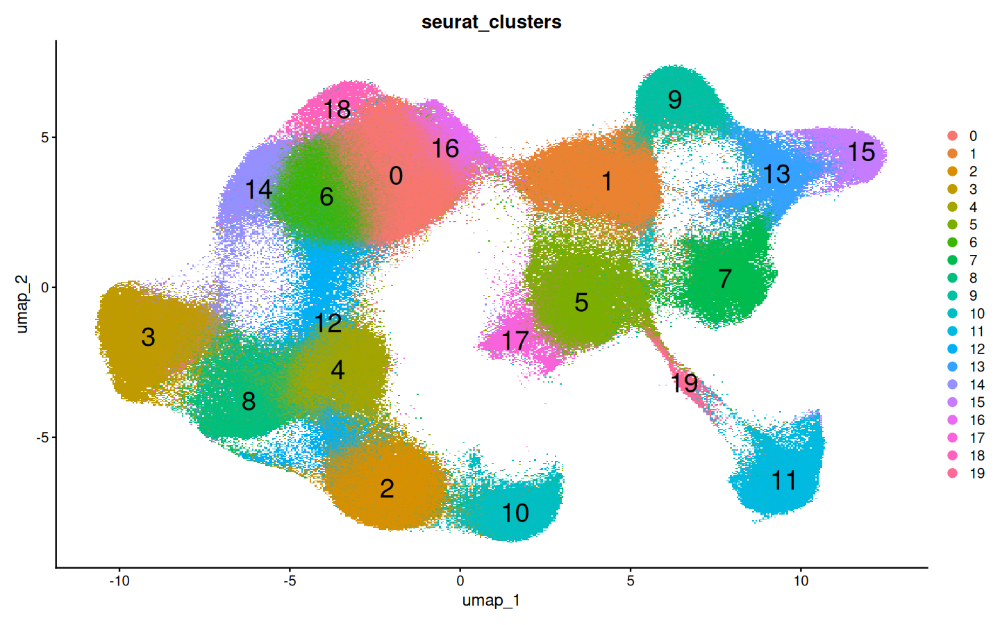

In [21]:
options(repr.plot.width = 12, repr.plot.height = 7.5)

DimPlot(gut_allt_integrated, group.by = "seurat_clusters", label = T, label.size = 8)

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



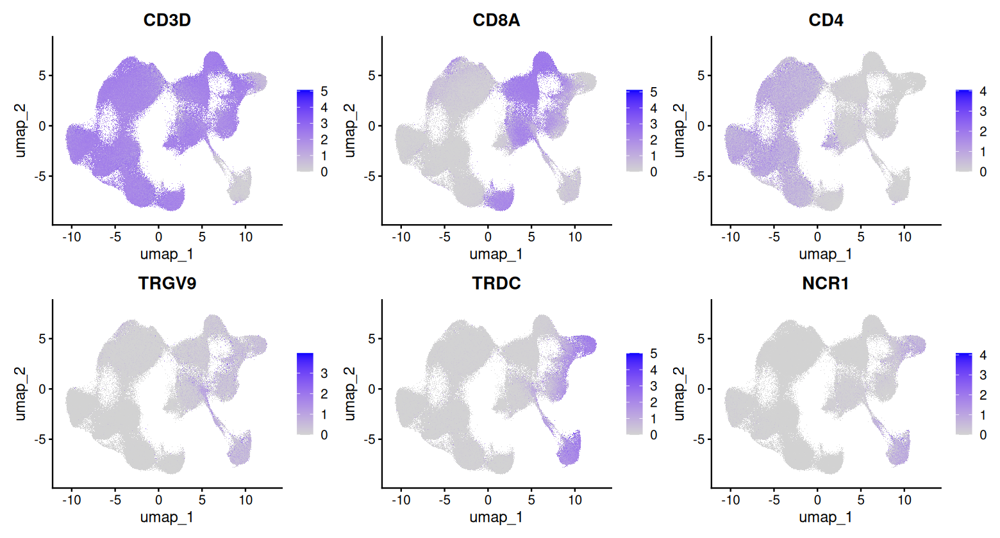

In [373]:
options(repr.plot.width = 13, repr.plot.height = 7)
FeaturePlot(gut_allt_integrated,features = c("CD3D","CD8A","CD4","TRGV9","TRDC","NCR1"), ncol = 3, min.cutoff = 0)

### Cluster tree

In [370]:
DefaultAssay(gut_allt_integrated)

[1] "integrated"

In [371]:
gut_allt_integrated <- BuildClusterTree(
  gut_allt_integrated,
  dims = 1:20,
  reorder = FALSE,
  reorder.numeric = FALSE
)

In [374]:
tree <- gut_allt_integrated@tools$BuildClusterTree
tree$tip.label <- paste0("Cluster ", tree$tip.label)

In [ ]:
colors  <- c(
    "#4c9c9cff", # Tem 
     "#92c0dfff", #Naive
     "#92c0dfff", #Naive
     "#2e8a3fff", # Temra
     "#92c0dfff", #Naive
     "#2e8a3fff", # Temra
    "#74bc68ff",  # Tcm
    "#74bc68ff",  # Tcm
    "#88aa00ff",
    "#4c9c9cff", # Tem 
    "#92c0dfff", #Naive
    "#4c9c9cff")

In [375]:
p <- ggtree::ggtree(tree, aes(x, y)) +
  scale_y_reverse() +
  ggtree::geom_tree() +
  ggtree::theme_tree() +
  ggtree::geom_tiplab(offset = 1) +
  ggtree::geom_tippoint(#color = colors, 
                        shape = 16, size = 5) +
  coord_cartesian(clip = 'off') +
  theme(plot.margin = unit(c(0,2.5,0,0), 'cm'))

#ggsave('plots/cluster_tree.png', p, height = 4, width = 6)

Scale for y is already present.
Adding another scale for y, which will replace the existing scale.


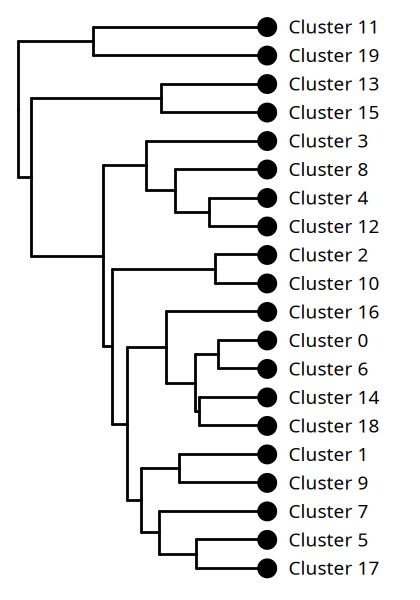

In [377]:
options(repr.plot.width=3.5, repr.plot.height=5)
p

### Marker heatmap

In [251]:
dim(gut_allt_integrated)

[1]  36601 588063

In [257]:
gut_allt_integrated

An object of class Seurat 
74202 features across 588063 samples within 3 assays 
Active assay: RNA (36601 features, 0 variable features)
 2 layers present: counts, data
 2 other assays present: integrated, RNA3
 2 dimensional reductions calculated: pca, umap

In [173]:
markers3  <- c('KLF2','SELL',"LEF1",'CCR7',"TCF7",
  #'GPR183','ITGB1',"NEFL",
  'BATF','TNFRSF18','IKZF2','CTLA4','IL2RA','FOXP3','ENTPD1',
  'IL21','CXCL13','CXCR5','IL4',
  'RORA','CCR6','S100A6','CST7', 'TBX21', 'S100A4', 'CCL3L1', 'KLRB1', 
  'ZBTB16', 'CCL25', 'TNF', 'FASLG', 'CD40LG', 'IL22', 'IL23R', 'IL17A', 
  'RORC', 'IL5', 'GATA3', 'XCL1', 'CCL5', 'CXCR3', 'CXCR6', 'PRF1', 
               'IL10',"IL19","MKI67","PCNA","MCM6",
               'IL13', 'IFNG', 'CCL4', 'HLA-DRB5', 'HLA-DRA', 'EOMES', 'GZMB', 'GNLY', 
  'KLRD1', 'IL17F', 'IL26'
 )

avgexp = AverageExpression(gut_allt_integrated, features = markers3, group.by = "seurat_clusters",
                           return.seurat = F,
                          assay = "RNA")

In [7]:
avgexp

  [[ suppressing 20 column names ‘g0’, ‘g1’, ‘g2’ ... ]]



$integrated
46 x 20 sparse Matrix of class "dgCMatrix"
                                                                    
KLF2      0.70506697  0.562394069 9.7356959865 0.76288502 1.11219647
SELL      0.10149843  0.065319304 6.4474289633 1.44150528 0.89395480
LEF1      0.30348033  0.194943621 6.0293908088 0.68585163 2.44407446
CCR7      0.24613345  0.252863391 7.5847324609 1.41742311 3.18362113
TCF7      1.15822569  1.645186319 5.5808022979 0.27718278 4.42221156
GPR183    6.58825869  3.666183656 3.9689658273 3.63789989 7.14656766
BATF      0.68235207  0.503205097 0.6095108564 6.11743309 1.66468188
TNFRSF18  0.58102238  0.067689451 0.0296141180 3.32052951 0.25299163
IKZF2     0.07503683  0.136880148 0.2119206510 1.40343192 0.30053789
CTLA4     0.47068001  0.068827815 0.4897181989 4.34605969 1.41458171
IL2RA     0.19489841  0.121065985 0.1000077078 1.89873759 0.20084850
FOXP3     0.12313082  0.055025837 0.1652860441 4.58678231 0.24736176
CD177     0.01116011  0.003750722 0.0023900682 0

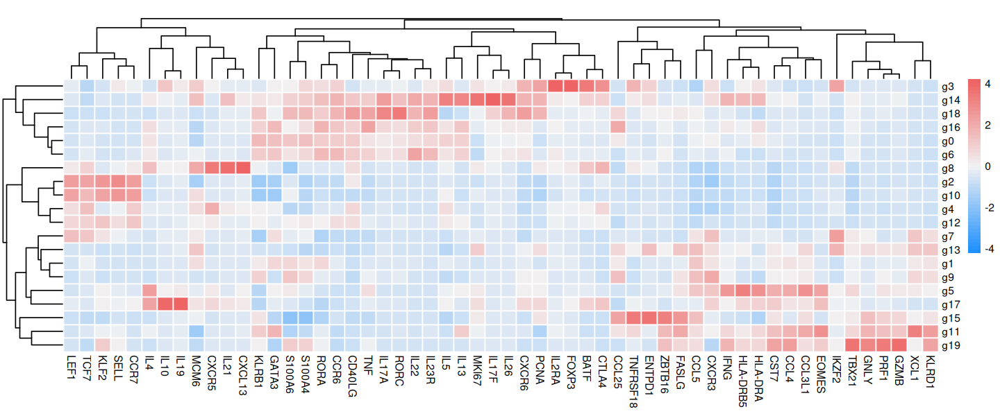

In [174]:
options(repr.plot.width = 12, repr.plot.height = 5)
pheatmap::pheatmap(t(avgexp$RNA), main = "", 
         scale = "column", cluster_cols = T, cluster_rows = T,
        color=colorRampPalette(c("dodgerblue", "grey95", "indianred2"))(50), 
         border_color = "white",
                  fontsize = 9)

In [169]:
markers1  <- rev(c("CD3D","CD4","CD8A","CD8B","TRDC","TRGC1","FCER1G","NCR1"))
avgexp = AverageExpression(gut_allt_integrated, features = markers1, group.by = "seurat_clusters",
                           return.seurat = F,
                          assay = "RNA")

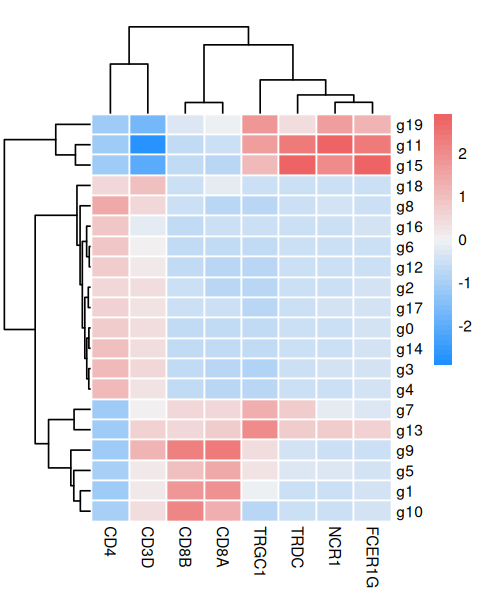

In [170]:
options(repr.plot.width = 4, repr.plot.height = 5)
pheatmap::pheatmap(t(avgexp$RNA), main = "", 
         scale = "column", cluster_cols = T, cluster_rows = T,
        color=colorRampPalette(c("dodgerblue", "grey95", "indianred2"))(50), 
         border_color = "white",
                  fontsize = 9)

In [105]:
mtx_ordered <- t(avgexp$RNA)[c(2,10,5,7,3,9,1,6,4,11,8),]

In [109]:
mtx_ordered2 <- as.matrix(mtx_ordered)[,match(markers3, colnames(mtx_ordered))]
mtx_ordered2

,KLF2,SELL,LEF1,CCR7,TCF7,GPR183,ITGB1,NEFL,BATF,TNFRSF18,⋯,IFNG,CCL4,HLA-DRB5,HLA-DRA,EOMES,GZMB,GNLY,KLRD1,IL17F,IL26
g1,9.3290113,7.61742833,6.4619170,7.0785000,6.8108969,4.013181,0.5909909,0.0120310507,0.6885399,0.01915915,⋯,0.01802438,0.0966652,0.2724409,0.7821456,0.02136629,0.007606033,0.02567232,0.01468868,0.001141434,0.0004225353
g9,6.7873263,2.96082144,3.1687248,4.5879569,4.4613203,5.547786,1.5052999,0.0739521103,1.2629697,0.42711706,⋯,0.12533250,0.1466722,0.3756998,0.8331242,0.01620357,0.009571564,0.05641459,0.03498248,0.017180225,0.0091396399
g4,0.9521329,0.88824202,2.8441184,3.8793189,5.1661908,7.444668,0.6074403,0.0107110052,1.5209878,0.18240488,⋯,0.07419529,0.1590220,0.3652586,0.9971850,0.01227010,0.008304094,0.02521046,0.01329410,0.010522115,0.0028159407
g6,3.4675777,2.86743269,3.4175120,4.1523759,2.8828204,3.952757,0.9371268,0.0024135569,3.3432258,2.05902939,⋯,0.12356974,0.2074729,0.4861199,1.0003465,0.02656951,0.030155296,0.03875721,0.03776899,0.064716051,0.0316605844
g2,0.8678189,1.66349104,0.8509288,1.4257759,0.2150668,3.794870,0.7909567,0.0007264467,6.2392759,4.10028266,⋯,0.10001890,0.3090068,0.7700555,1.4091353,0.01732631,0.116267389,0.22891943,0.02813588,0.063965406,0.1602815066
g8,0.5436351,0.80322257,1.4718430,1.5864984,5.5315037,3.530055,0.7501860,0.0009032855,2.9705867,1.17452746,⋯,0.08093650,0.1201805,0.3552449,0.8787730,0.01113457,0.003598741,0.01566441,0.01994733,0.006659416,0.0009602288
g0,1.3288481,0.17690022,0.4936754,0.5362619,1.9563530,6.000160,0.7586000,0.0184475896,0.8281746,0.71607613,⋯,0.76055823,1.3490163,0.4015396,1.0194500,0.04891774,0.070748001,0.17768505,0.03972759,0.004510929,0.0112352410
g5,1.0974748,0.11692470,0.3794923,0.3690927,1.7982927,5.448623,0.6781588,0.0091219644,0.8577073,0.50735115,⋯,0.84443378,1.9294442,0.5534729,1.4061084,0.04979350,0.060641877,0.15214551,0.07419839,0.008098591,0.0413472363
g3,0.5302948,0.04135651,0.1662201,0.2447020,1.2399440,4.415545,0.8007439,0.0049586693,1.1942208,0.67555448,⋯,0.20268719,0.7225714,0.4478638,1.1197625,0.02230743,0.076565229,0.09244853,0.07767620,0.106894103,0.2409890699
g10,0.6015342,0.08506835,0.2867635,0.2264664,1.2647778,2.242205,0.6977962,0.0097201697,1.2288467,0.49209435,⋯,0.30798718,1.0657302,0.4183342,0.9153405,0.04810724,0.090642126,0.16032760,0.17704021,0.097531289,0.2440902616


In [112]:
dir.create("figures/characterization_CD4CTL/")

In [113]:
pheatmap::pheatmap(mtx_ordered2, main = "", 
         scale = "column", cluster_cols = F, cluster_rows = F,
        color=colorRampPalette(c("dodgerblue", "grey95", "indianred2"))(50), 
         border_color = "white",
                  fontsize = 9, filename = "figures/characterization_CD4CTL/heatmap_cluster_markers.pdf",
                  width = 12, height = 4)

### Annotating clusters

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



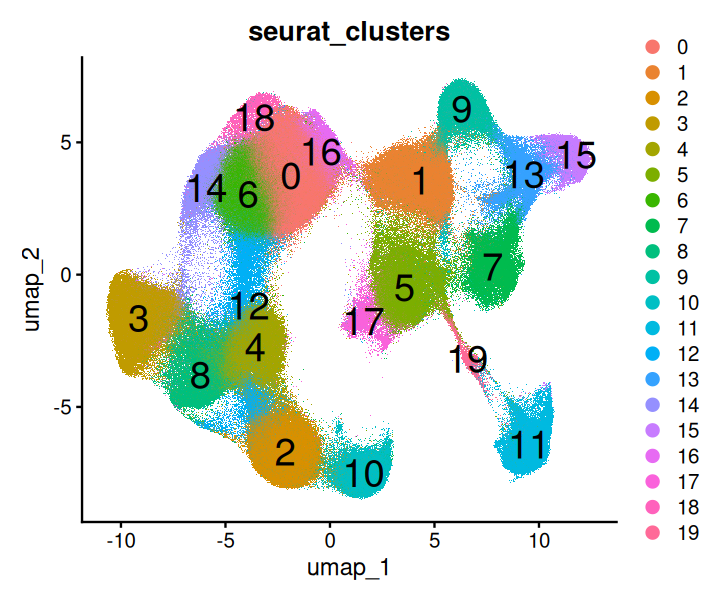

In [33]:
DimPlot(gut_allt_integrated, group.by = "seurat_clusters", label = T, label.size = 8)

In [ ]:
gut_allt_integrated@meta.data <- gut_allt_integrated@meta.data  %>% mutate(annotations = recode_factor(seurat_clusters, 
"0" = "CD4 Th17_1",                                                                         
"1" = "CD8 memory",
"2" = "CD4 Naive",
"3" = "CD4 Treg",
"4" = "CD4 Tcm",
"5" = "CD8 Memory",
"6" = "CD4 Th17_2",
"7" = "CD8 Tgd",
"8" = "CD4 Tfh",
"9" = "IEL CD8",
"10" = "CD8 Naive",
"11" = "NK cells",
"12" = "CD4 Tcm",
"13" = "IEL Tgd",
"14" = "CD4 CTL",
"15" = "IEL NK cells",
"16" = "CD4 Th17_3",
"17" = "CD4 Tr1-like",
"18" = "IEL CD4",
"19" = "NK cells"))

## Coarse annotations

In [22]:
gut_allt_integrated  <- FindClusters(gut_allt_integrated, res = c(0.2))

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 588063
Number of edges: 13479680

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9525
Number of communities: 10
Elapsed time: 728 seconds


Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



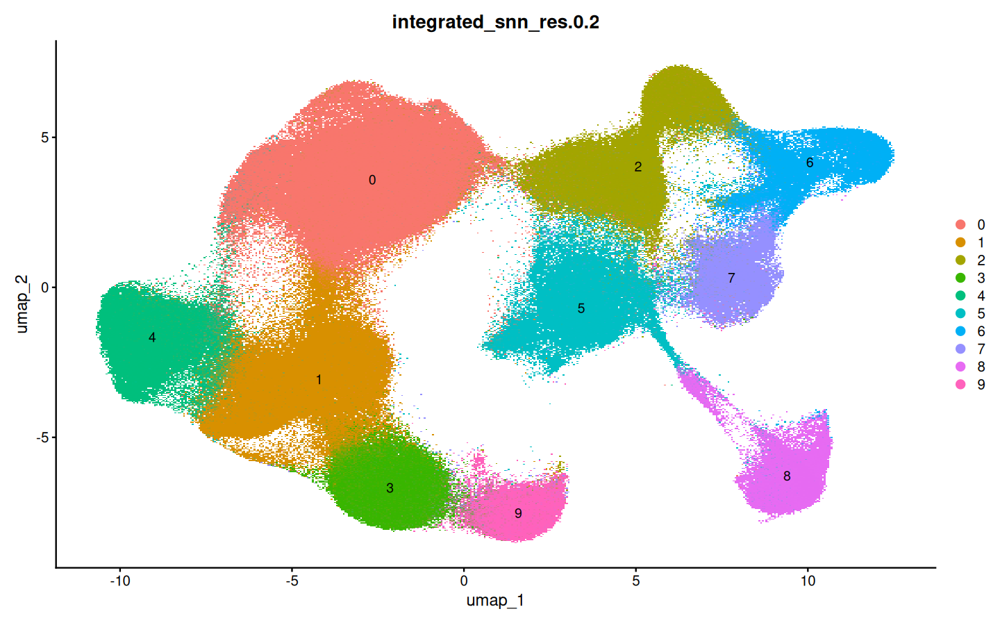

In [23]:
DimPlot(gut_allt_integrated, group.by = "integrated_snn_res.0.2", label = T)

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



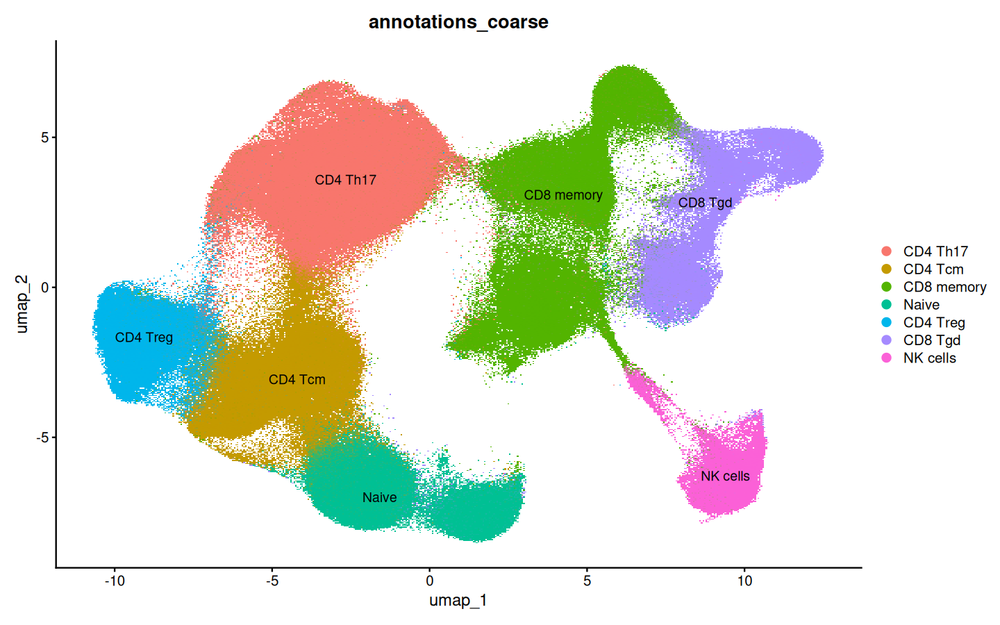

In [24]:
gut_allt_integrated@meta.data <- gut_allt_integrated@meta.data  %>% mutate(annotations_coarse = recode_factor(integrated_snn_res.0.2, 
"0" = "CD4 Th17",                                                                         
"1" = "CD4 Tcm",
"2" = "CD8 memory",
"3" = "Naive",
"4" = "CD4 Treg",
"5" = "CD8 memory",
"6" = "CD8 Tgd",
"7" = "CD8 Tgd",
"8" = "NK cells",
"9" = "Naive"))

DimPlot(gut_allt_integrated, group.by = "annotations_coarse", label = T)

### Cluster markers

In [37]:
gut_allt_integrated$cluster_sample  <- paste(gut_allt_integrated$seurat_clusters, gut_allt_integrated$data_folder, sep = "---")

In [39]:
avgexp  <- AverageExpression(gut_allt_integrated, group.by = c("cluster_sample"), return.seurat = T, assays = "RNA")

Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 2.1 GiB”


In [40]:
avgexp@meta.data  <- avgexp@meta.data  %>% 
separate(cluster_sample, into = c("seurat_clusters", "data_folder"), sep = "---", remove = F)

In [41]:
Idents(avgexp)  <- avgexp$seurat_clusters

In [42]:
mrk  <- FindAllMarkers(avgexp)

Calculating cluster g0

Calculating cluster g1

Calculating cluster g10

Calculating cluster g11

Calculating cluster g12

Calculating cluster g13

Calculating cluster g14

Calculating cluster g15

Calculating cluster g16

Calculating cluster g17

Calculating cluster g18

Calculating cluster g19

Calculating cluster g2

Calculating cluster g3

Calculating cluster g4

Calculating cluster g5

Calculating cluster g6

Calculating cluster g7

Calculating cluster g8

Calculating cluster g9



Warning message:
“The following requested variables were not found: percent.mt”
Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



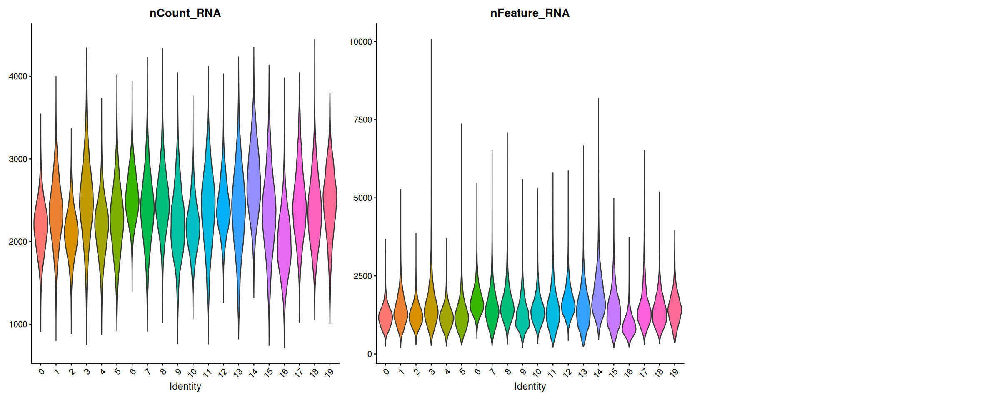

In [49]:
options(repr.plot.height = 8, repr.plot.width = 20)
VlnPlot(gut_allt_integrated, features = c("nCount_RNA","nFeature_RNA", "percent.mt"), pt.size = 0)

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



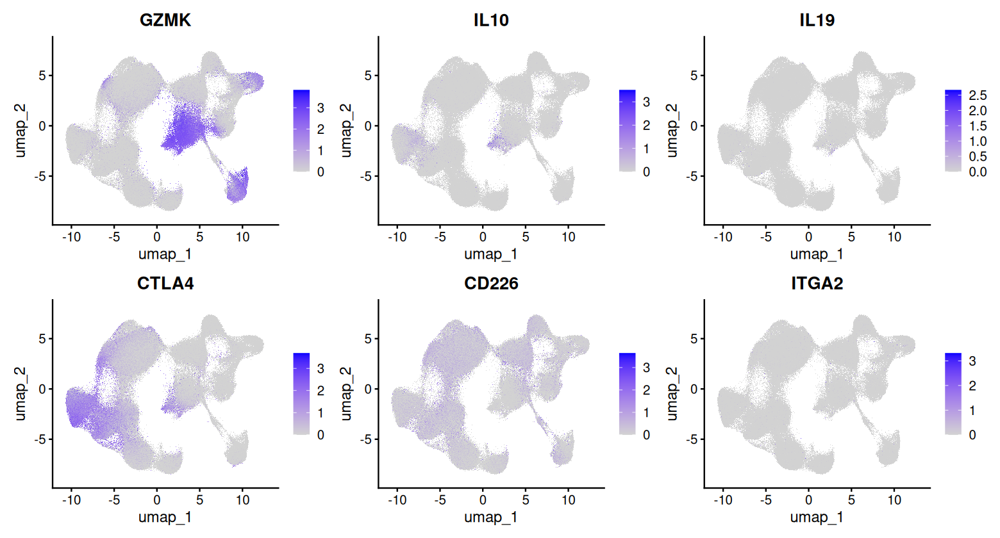

In [163]:
DefaultAssay(gut_allt_integrated)  <- "RNA"
options(repr.plot.width = 13, repr.plot.height = 7)
FeaturePlot(gut_allt_integrated,features = c("GZMK","IL10","IL19","CTLA4","CD226","ITGA2"), ncol = 3, min.cutoff = 0)
DefaultAssay(gut_allt_integrated)  <- "integrated"


Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



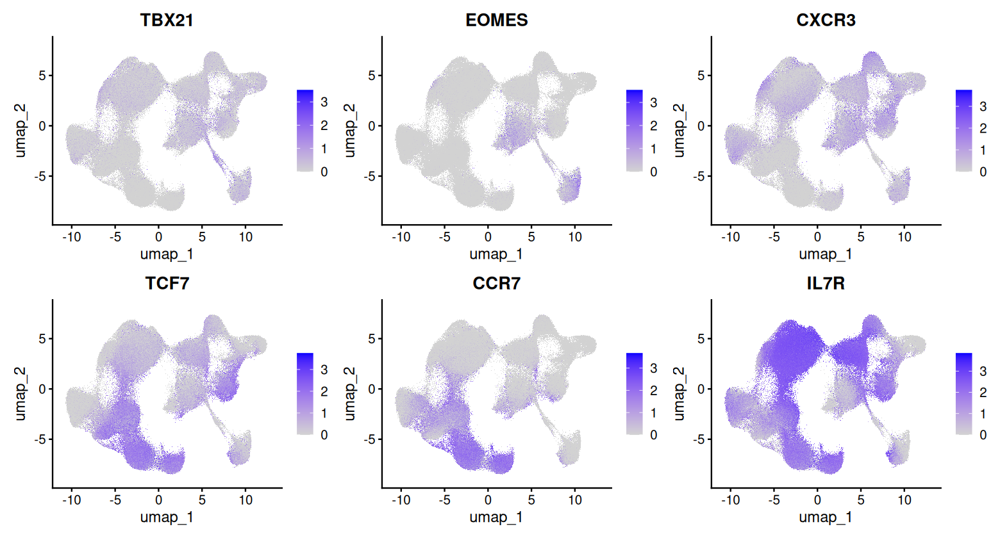

In [177]:
DefaultAssay(gut_allt_integrated)  <- "RNA"
options(repr.plot.width = 13, repr.plot.height = 7)
FeaturePlot(gut_allt_integrated,features = c("TBX21","EOMES","CXCR3","TCF7","CCR7","IL7R"), ncol = 3, min.cutoff = 0)
DefaultAssay(gut_allt_integrated)  <- "integrated"


Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



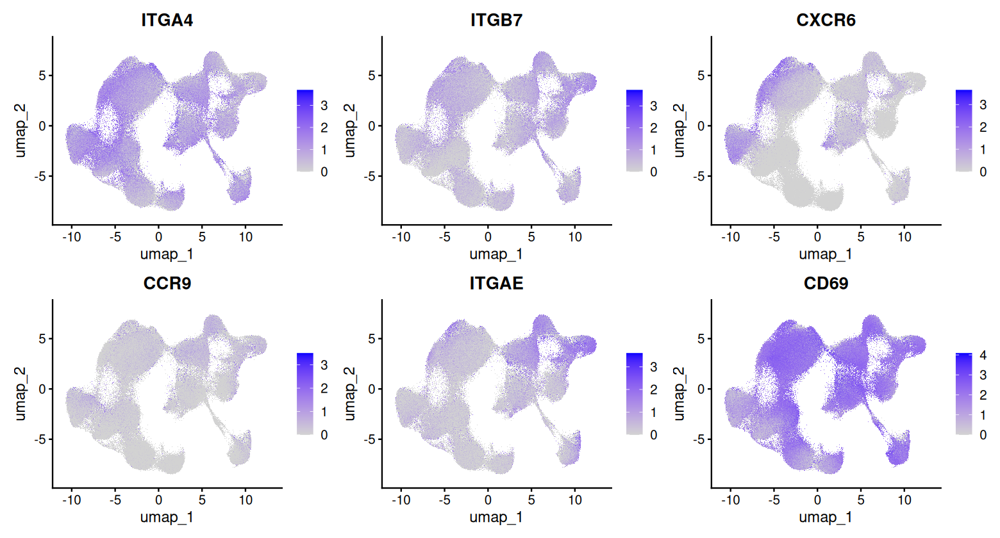

In [180]:
DefaultAssay(gut_allt_integrated)  <- "RNA"
options(repr.plot.width = 13, repr.plot.height = 7)
FeaturePlot(gut_allt_integrated,features = c("ITGA4","ITGB7","CXCR6","CCR9","ITGAE","CD69"), ncol = 3, min.cutoff = 0)
DefaultAssay(gut_allt_integrated)  <- "integrated"


Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



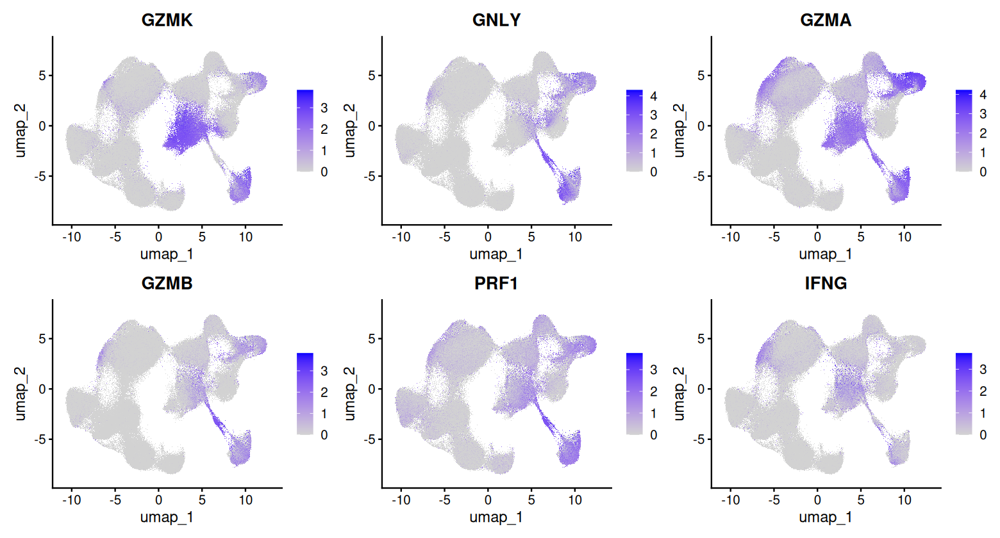

In [164]:
DefaultAssay(gut_allt_integrated)  <- "RNA"
options(repr.plot.width = 13, repr.plot.height = 7)
FeaturePlot(gut_allt_integrated,features = c("GZMK","GNLY","GZMA","GZMB","PRF1","IFNG"), ncol = 3, min.cutoff = 0)
DefaultAssay(gut_allt_integrated)  <- "integrated"

In [176]:
mrk  %>% dplyr::filter(cluster == "g7")

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
ZNF683.16,1.187435e-304,4.279501,0.904,0.268,4.346131e-300,g7,ZNF683
KIR3DL3.14,3.853230e-250,2.757748,0.545,0.067,1.410321e-245,g7,KIR3DL3
TRDV1.11,1.373150e-235,3.312830,0.929,0.404,5.025866e-231,g7,TRDV1
TRDV3.12,5.807991e-228,3.322744,0.694,0.150,2.125783e-223,g7,TRDV3
FBLN2.15,3.423484e-218,3.423081,0.562,0.090,1.253029e-213,g7,FBLN2
PADI4.12,1.851564e-204,3.312728,0.598,0.117,6.776910e-200,g7,PADI4
TRGV11.13,2.817889e-177,3.111206,0.355,0.039,1.031376e-172,g7,TRGV11
CNR2.15,1.582245e-172,3.368932,0.533,0.103,5.791176e-168,g7,CNR2
FXYD2.14,3.189411e-170,3.218027,0.685,0.209,1.167356e-165,g7,FXYD2


### Wherry annotations

In [11]:
load("../VN_misc/ref_wherry_new.RData")

In [13]:
ref_wherry_new

,R_S7003,R_S7004,R_S7005,R_S7006,R_S7007,R_S7013,R_S7014,R_S7015,R_S7016,R_S7017,⋯,R_S8129,R_S8132,R_S8133,R_S8136,R_S8140,R_S8207,R_S8219,R_S8230,R_S8240,R_S8260
TSPAN6,1.9838463,2.34520676,0.86135823,1.51797166,1.98384631,2.345207,0.86135823,1.5179717,1.51797166,2.89009259,⋯,3.38323329,1.60620859,3.2528779,0.10364049,1.329329,2.5524190,1.51614588,0.1725069,2.140902,1.020249
DPM1,5.9177623,4.65332845,5.71102899,5.71102899,5.59815634,5.477836,6.18963191,6.5910671,5.78257512,5.67417536,⋯,5.18088639,5.88259934,5.9374605,5.67280347,5.947766,5.8156243,5.83360231,5.9873771,5.779087,6.051494
SCYL3,5.7069857,5.56341594,5.96182898,5.62232525,5.96182898,4.570667,4.77440062,3.6580763,5.67923724,5.47098472,⋯,6.61337514,6.50244098,6.0611498,5.53473381,6.064398,6.1646407,5.09396116,5.0939612,4.913837,5.674044
C1orf112,2.2061292,1.83360666,1.83360666,3.80128846,2.99076724,2.767846,0.67644609,2.9907672,2.20612916,3.36328973,⋯,3.94286095,4.74193232,3.8686180,2.57172112,5.411147,3.4792281,4.17657038,3.5884967,2.284101,2.925716
FGR,6.0337807,5.22520482,4.39511295,4.86932406,3.78132399,8.639521,7.00902299,6.1850733,4.33128237,3.19909568,⋯,3.11588989,2.98160665,3.3512537,4.70579325,3.839439,5.2562506,1.49062792,4.8635453,6.088634,5.043829
CFH,7.6328400,7.30129509,7.18178276,5.40169755,1.55658501,5.140954,5.34092960,6.3402772,6.19641335,0.02133744,⋯,0.53784020,1.45574146,3.5870422,0.53784020,2.091054,1.0128176,3.11903658,2.0659271,4.511172,3.735066
FUCA2,3.6861303,3.82729380,3.53450109,3.37072902,1.95250926,3.534501,5.24551356,4.9527208,3.68613034,3.19269864,⋯,3.10906016,3.10906016,1.5396797,4.45949352,4.824956,1.5194650,3.00915374,4.0962032,2.264309,4.096203
GCLC,6.5979277,6.65534136,6.61247276,6.29345437,6.25780969,6.878934,6.59792766,6.4766175,6.55349289,5.96212649,⋯,5.33257837,5.94869238,5.0331760,6.06095040,5.884999,6.1292455,6.73549799,5.2351626,6.103186,5.334434
NFYA,8.0143349,7.64717381,7.79687379,7.78084920,7.64717381,7.271825,7.26107758,7.1151073,7.41584616,7.19519166,⋯,7.39976846,7.23849962,8.0441663,7.77484471,7.402242,7.4546786,7.75579509,8.1640502,7.475726,7.671987
STPG1,3.0298379,4.33750280,2.63654731,4.49784060,3.85821951,2.129508,1.80816571,4.4978406,3.35117973,3.74447034,⋯,3.22058065,4.00543044,4.3482757,3.08689342,4.169010,4.1302071,3.67522206,4.2732293,2.097521,1.605170


In [15]:
seurat_dataset  <- AggregateExpression(gut_allt_integrated, 
                                       features = rownames(gut_allt_integrated@assays$RNA), 
                                       group.by = "seurat_clusters",
                           return.seurat = F,
                          assay = "RNA")

In [18]:
### Annotate the dataset with Wherry dataset
        pred.singler2 <- SingleR(test = seurat_dataset$RNA, ref = ref_wherry_new$matrix,
        labels = ref_wherry_new$labels, fine.tune = F)


In [20]:
pred.singler2$scores

CD4_BulkNaive,CD4_Tfh,CD4_Treg,CD8_CM,CD8_EM1,CD8_EM2,CD8_EMRA,CD8_Naive,CD8_PD1+CD39+,CD8_SCM-R3-,CD8_SCM-R3+
0.5569405,0.4119866,0.5868047,0.6725540,0.6524553,0.6054756,0.5559050,0.4780962,0.5483810,0.4925798,0.5336000
0.5376033,0.3829773,0.5516794,0.6777524,0.6553227,0.6108857,0.5805337,0.4925056,0.5902788,0.5042616,0.5340162
0.7209631,0.4414500,0.6295373,0.6504455,0.5361499,0.4654139,0.4368035,0.6530600,0.4839645,0.5155068,0.5687468
0.4824052,0.3997927,0.6619279,0.5722818,0.5564482,0.5098651,0.4736626,0.3985220,0.5727696,0.4457104,0.4473895
0.6168118,0.4779205,0.6581854,0.6440911,0.5650123,0.5033715,0.4729265,0.5353400,0.5338178,0.5116480,0.5361991
0.5031643,0.3823623,0.5678510,0.6768204,0.6844865,0.6461551,0.6281084,0.4369765,0.6629479,0.5071349,0.5233181
0.5641530,0.4211244,0.5976452,0.6849653,0.6664494,0.6207913,0.5652587,0.4849121,0.5579232,0.5060474,0.5393608
0.5713083,0.3921324,0.5568471,0.6713398,0.6307952,0.5832218,0.5803729,0.5373601,0.5816958,0.5230707,0.5604532
0.5338787,0.4484223,0.6441122,0.5874861,0.5467628,0.4922302,0.4667068,0.4512407,0.5650232,0.4719500,0.4694948
0.4975624,0.3536564,0.5154373,0.6269382,0.6143118,0.5753137,0.5516025,0.4584115,0.5699506,0.4706487,0.4963164


In [23]:
mtx  <- pred.singler2$scores
rownames(mtx)  <- colnames(seurat_dataset$RNA)

In [25]:
mtx

,CD4_BulkNaive,CD4_Tfh,CD4_Treg,CD8_CM,CD8_EM1,CD8_EM2,CD8_EMRA,CD8_Naive,CD8_PD1+CD39+,CD8_SCM-R3-,CD8_SCM-R3+
g0,0.5569405,0.4119866,0.5868047,0.6725540,0.6524553,0.6054756,0.5559050,0.4780962,0.5483810,0.4925798,0.5336000
g1,0.5376033,0.3829773,0.5516794,0.6777524,0.6553227,0.6108857,0.5805337,0.4925056,0.5902788,0.5042616,0.5340162
g2,0.7209631,0.4414500,0.6295373,0.6504455,0.5361499,0.4654139,0.4368035,0.6530600,0.4839645,0.5155068,0.5687468
g3,0.4824052,0.3997927,0.6619279,0.5722818,0.5564482,0.5098651,0.4736626,0.3985220,0.5727696,0.4457104,0.4473895
g4,0.6168118,0.4779205,0.6581854,0.6440911,0.5650123,0.5033715,0.4729265,0.5353400,0.5338178,0.5116480,0.5361991
g5,0.5031643,0.3823623,0.5678510,0.6768204,0.6844865,0.6461551,0.6281084,0.4369765,0.6629479,0.5071349,0.5233181
g6,0.5641530,0.4211244,0.5976452,0.6849653,0.6664494,0.6207913,0.5652587,0.4849121,0.5579232,0.5060474,0.5393608
g7,0.5713083,0.3921324,0.5568471,0.6713398,0.6307952,0.5832218,0.5803729,0.5373601,0.5816958,0.5230707,0.5604532
g8,0.5338787,0.4484223,0.6441122,0.5874861,0.5467628,0.4922302,0.4667068,0.4512407,0.5650232,0.4719500,0.4694948
g9,0.4975624,0.3536564,0.5154373,0.6269382,0.6143118,0.5753137,0.5516025,0.4584115,0.5699506,0.4706487,0.4963164


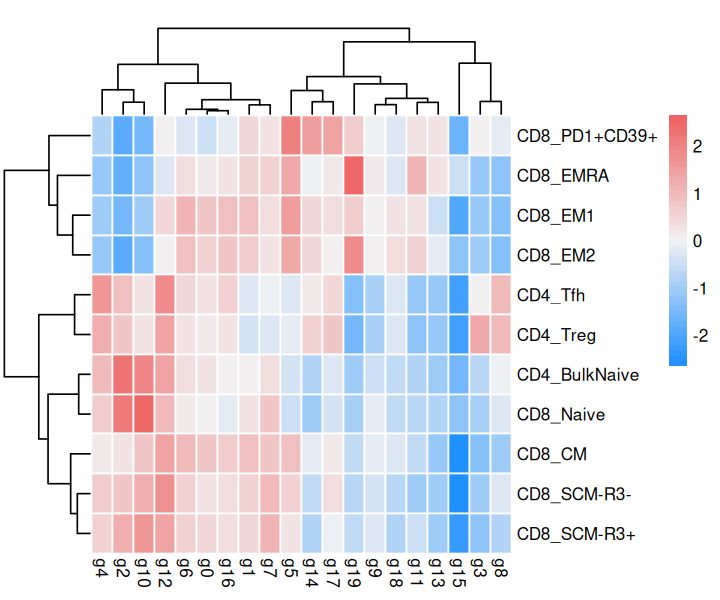

In [32]:
options(repr.plot.width = 6, repr.plot.height = 5)
pheatmap::pheatmap(t(mtx), main = "", 
         scale = "row", cluster_cols = T, cluster_rows = T,
        color=colorRampPalette(c("dodgerblue", "grey95", "indianred2"))(50), 
         border_color = "white",
                  fontsize = 10)

## MAIT and iNKT

In [90]:
md  <- gut_allt_integrated@meta.data

In [91]:
paths <- list.files("./data/tcr/")

In [92]:
data_folders  <- gsub(paths, pattern = ".csv", replacement = "")
data_folders  <- gsub(data_folders, pattern = "_1_1_2", replacement = "_1_1_1")
data_folders  <- gsub(data_folders, pattern = "_VDJ", replacement = "_GEX")

In [93]:
data_folders_df <- data.frame(data_folder = data_folders)
data_folders_df$in_meta <- data_folders %in% md$data_folder
data_folders_df  %>% dplyr::filter(in_meta == F)

data_folder,in_meta
<chr>,<lgl>
003-043_T0_BLD_CD3_5p_GEX,FALSE
1193598_1_1_1,FALSE
1193606_1_1_1,FALSE
1193625_1_1_1,FALSE
1405411_1_1_1,FALSE
1405456_1_1_1,FALSE
1405458_1_1_1,FALSE
1542394_1_1_1,FALSE
1542400_1_1_1,FALSE


In [66]:
unique(gut_allt_integrated$data_folder)  %in% data_folders  %>% table

.
FALSE  TRUE 
  148   371 

In [67]:
gut_allt_integrated_folders <- data.frame(data_folder = unique(gut_allt_integrated$data_folder) ,
                             in_vdj = unique(gut_allt_integrated$data_folder)  %in% data_folders)

In [68]:
gut_allt_integrated_folders  %>% dplyr::filter(in_vdj == F)

data_folder,in_vdj
<chr>,<lgl>
1193492_1_1_1,FALSE
1193493_1_1_1,FALSE
1193491_1_1_1,FALSE
1193570_1_1_1,FALSE
1193495_1_1_1,FALSE
1193571_1_1_1,FALSE
1193572_1_1_1,FALSE
1193496_1_1_1,FALSE
1193567_1_1_1,FALSE


In [94]:
folders_ready <- data_folders[which(data_folders %in% md$data_folder)]

In [95]:
paths_folders_ready <- paste0("data/tcr/",paths[which(data_folders %in% md$data_folder)])

In [96]:
paths_folders_ready[1]

[1] "data/tcr/003-043_T0_COL_EPI_5p_VDJ.csv"

In [97]:
md$raw_barcode <-  substr(md$barcode,1,18)

In [98]:
colnames(md)

[1] "orig.ident"                  "nCount_RNA"                 
  [3] "nFeature_RNA"                "bc"                         
  [5] "data_folder"                 "data_folder2"               
  [7] "sample"                      "diagnosis"                  
  [9] "subgroup_primary"            "subgroup_secondary"         
 [11] "subgroup_tertiary"           "Rome_coarse"                
 [13] "Rome_classification"         "antitnf_response"           
 [15] "participant_id"              "timepoint"                  
 [17] "age"                         "sex"                        
 [19] "site"                        "tissue"                     
 [21] "layer"                       "prime"                      
 [23] "version_10x"                 "sample_old"                 
 [25] "data_type"                   "seq_run"                    
 [27] "collection_purpose"          "collection_date"            
 [29] "days"                        "antitnf"                    
 [31] "antitnf_repeat"              "duo_inflammation"           
 [33] "ile_inflammation"            "col_inflammation"           
 [35] "sample_inflamed"             "colon_site"                 
 [37] "score_type"                  "severity_score"             
 [39] "weighted_severity_score"     "severity_score_date"        
 [41] "severity_score_range"        "weighted_score_range"       
 [43] "barcodes"                    "scrublet_doublet_scores"    
 [45] "outliers"                    "n_outliers"                 
 [47] "n_genes_by_counts"           "log1p_n_genes_by_counts"    
 [49] "total_counts"                "log1p_total_counts"         
 [51] "pct_counts_in_top_50_genes"  "pct_counts_in_top_100_genes"
 [53] "pct_counts_in_top_200_genes" "pct_counts_in_top_500_genes"
 [55] "total_counts_mt"             "log1p_total_counts_mt"      
 [57] "pct_counts_mt"               "total_counts_ribo"          
 [59] "log1p_total_counts_ribo"     "pct_counts_ribo"            
 [61] "total_counts_hb"             "log1p_total_counts_hb"      
 [63] "pct_counts_hb"               "quality_label"              
 [65] "predicted_labels"            "celltypist_score"           
 [67] "lvl1_annot"                  "quality_label1"             
 [69] "quality_label2"              "quality_label3"             
 [71] "lvl2_annot"                  "leiden_0.05"                
 [73] "leiden_0.1"                  "leiden_0.125"               
 [75] "leiden_0.15"                 "leiden_0.175"               
 [77] "leiden_0.2"                  "leiden_0.225"               
 [79] "leiden_0.25"                 "leiden_0.3"                 
 [81] "lvl3_annot_types"            "lvl3_annot_states"          
 [83] "RNA_snn_res.0.3"             "seurat_clusters"            
 [85] "barcode"                     "integrated_snn_res.0.5"     
 [87] "nCount_RNA3"                 "nFeature_RNA3"              
 [89] "leiden_0.3_mod"              "integrated_snn_res.0.6"     
 [91] "integrated_snn_res.0.7"      "integrated_snn_res.0.8"     
 [93] "cluster_and_sample"          "Singler_Th17"               
 [95] "age_group"                   "is_cell"                    
 [97] "chain"                       "contig_id"                  
 [99] "high_confidence"             "productive"                 
[101] "length"                      "reads"                      
[103] "umis"                        "vdj_source"                 
[105] "count_TRA"                   "count_TRB"                  
[107] "count_Multi"                 "cdr3_A1"                    
[109] "cdr3_A1_nt"                  "cdr3_A2"                    
[111] "cdr3_A2_nt"                  "cdr3_B"                     
[113] "cdr3_B_nt"                   "cdr3_Multi"                 
[115] "cdr3_Multi_nt"               "v_gene_A1"                  
[117] "j_gene_A1"                   "v_gene_A2"                  
[119] "j_gene_A2"                   "v_gene_B"                   
[121] "d_gene_B"                    "j_gen

In [114]:
colnames(md)[128:137]

[1] "annotations"            "orig_cluster"           "RNA_snn_res.0.4"       
 [4] "integrated_snn_res.0.3" "integrated_snn_res.0.9" "cluster_sample"        
 [7] "test"                   "clone_abundance"        "log_clone_abundance"   
[10] "raw_barcode"

In [115]:
md  <- md[,c(1:95,128:137)]

In [116]:
source("vdj_code2.R")

In [117]:
i = 1

In [119]:
folder_process <- folders_ready[i]
md_sub <- md  %>% dplyr::filter(data_folder == folder_process)
all_contig_annotations <- read_csv(paths_folders_ready[i])

vdj_data_processed <- create.VDJ.metadata2(all_contig_annotations)
vdj_data_processed$raw_barcode <- rownames(vdj_data_processed)
md_sub2 <- left_join(md_sub, vdj_data_processed)
rownames(md_sub2) <- md_sub2$barcode
all_md <- md_sub2

Rows: 1026 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


In [120]:
for(i in 2:length(folders_ready)){
folder_process <- folders_ready[i]
md_sub <- md  %>% dplyr::filter(data_folder == folder_process)
all_contig_annotations <-     suppressWarnings(
read_csv(paths_folders_ready[i]))

vdj_data_processed <- create.VDJ.metadata2(all_contig_annotations)
vdj_data_processed$raw_barcode <- rownames(vdj_data_processed)
md_sub2 <- left_join(md_sub, vdj_data_processed)
rownames(md_sub2) <- md_sub2$barcode
    suppressWarnings(all_md <- rbind(all_md, md_sub2))
        
    print(paste("DONE:",i))
    }

Rows: 10904 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 2"


Rows: 2372 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 3"


Rows: 9846 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 4"


Rows: 3700 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 5"


Rows: 21914 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 6"


Rows: 5586 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 7"


Rows: 11324 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 8"


Rows: 450 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 9"


Rows: 4910 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 10"


Rows: 5343 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 11"


Rows: 10034 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 12"


Rows: 316 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 13"


Rows: 6502 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 14"


Rows: 165 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 15"


Rows: 1532 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 16"


Rows: 2995 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 17"


Rows: 4108 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 18"


Rows: 4288 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 19"


Rows: 1780 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 20"


Rows: 22604 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 21"


Rows: 897 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 22"


Rows: 8402 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 23"


Rows: 14658 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 24"


Rows: 220 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 25"


Rows: 4684 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 26"


Rows: 13340 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 27"


Rows: 9766 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 28"


Rows: 44466 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 29"


Rows: 34445 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 30"


Rows: 17001 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 31"


Rows: 7813 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 32"


Rows: 9579 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 33"


Rows: 9645 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 34"


Rows: 14160 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 35"


Rows: 8183 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 36"


Rows: 11575 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 37"


Rows: 8685 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 38"


Rows: 11196 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 39"


Rows: 8637 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 40"


Rows: 5218 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 41"


Rows: 9035 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 42"


Rows: 2578 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 43"


Rows: 12120 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 44"


Rows: 194 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 45"


Rows: 8956 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 46"


Rows: 504 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 47"


Rows: 10372 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 48"


Rows: 135 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 49"


Rows: 8486 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 50"


Rows: 2962 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 51"


Rows: 12791 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 52"


Rows: 307 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 53"


Rows: 6235 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 54"


Rows: 528 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 55"


Rows: 4645 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 56"


Rows: 46 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 57"


Rows: 1796 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 58"


Rows: 1145 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 59"


Rows: 12491 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 60"


Rows: 281 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 61"


Rows: 10087 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 62"


Rows: 6579 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 63"


Rows: 858 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 64"


Rows: 2322 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 65"


Rows: 1484 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 66"


Rows: 405 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 67"


Rows: 1677 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 68"


Rows: 4056 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 69"


Rows: 24 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (10): barcode, contig_id, chain, v_gene, j_gene, c_gene, cdr3, cdr3_nt, ...
dbl  (3): length, reads, umis
lgl  (5): is_cell, high_confidence, d_gene, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 70"


Rows: 1610 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 71"


Rows: 195 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 72"


Rows: 11928 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 73"


Rows: 23180 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 74"


Rows: 8353 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 75"


Rows: 577 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 76"


Rows: 1851 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 77"


Rows: 2132 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 78"


Rows: 4819 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 79"


Rows: 1896 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 80"


Rows: 2409 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 81"


Rows: 2249 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 82"


Rows: 4063 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 83"


Rows: 778 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 84"


Rows: 692 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 85"


Rows: 1614 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 86"


Rows: 1485 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 87"


Rows: 5146 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 88"


Rows: 8564 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 89"


Rows: 5247 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 90"


Rows: 6089 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 91"


Rows: 1917 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 92"


Rows: 16761 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 93"


Rows: 6849 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 94"


Rows: 4205 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 95"


Rows: 625 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 96"


Rows: 1386 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 97"


Rows: 3945 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 98"


Rows: 8015 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 99"


Rows: 1304 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 100"


Rows: 1512 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 101"


Rows: 5946 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 102"


Rows: 854 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 103"


Rows: 5571 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 104"


Rows: 241 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 105"


Rows: 425 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 106"


Rows: 5486 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 107"


Rows: 269 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 108"


Rows: 1104 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 109"


Rows: 13293 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 110"


Rows: 5395 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 111"


Rows: 4916 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 112"


Rows: 1584 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 113"


Rows: 4682 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 114"


Rows: 1331 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 115"


Rows: 4853 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 116"


Rows: 1951 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 117"


Rows: 4375 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 118"


Rows: 4852 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 119"


Rows: 5324 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 120"


Rows: 3714 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 121"


Rows: 2070 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 122"


Rows: 2832 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 123"


Rows: 273 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 124"


Rows: 4517 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 125"


Rows: 2382 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 126"


Rows: 12418 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 127"


Rows: 65 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 128"


Rows: 991 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 129"


Rows: 549 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 130"


Rows: 3411 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 131"


Rows: 5581 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 132"


Rows: 341 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 133"


Rows: 5397 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 134"


Rows: 1179 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 135"


Rows: 1521 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 136"


Rows: 3808 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 137"


Rows: 83 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 138"


Rows: 5720 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 139"


Rows: 1470 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 140"


Rows: 1475 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 141"


Rows: 1237 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 142"


Rows: 3172 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 143"


Rows: 8284 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 144"


Rows: 10348 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 145"


Rows: 1970 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 146"


Rows: 767 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 147"


Rows: 9976 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 148"


Rows: 3979 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 149"


Rows: 4410 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 150"


Rows: 2583 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 151"


Rows: 1072 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 152"


Rows: 401 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 153"


Rows: 2303 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 154"


Rows: 2184 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 155"


Rows: 12784 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 156"


Rows: 229 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 157"


Rows: 6046 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 158"


Rows: 2511 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 159"


Rows: 1654 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 160"


Rows: 538 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 161"


Rows: 490 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 162"


Rows: 1447 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 163"


Rows: 1304 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 164"


Rows: 1370 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 165"


Rows: 503 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 166"


Rows: 303 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 167"


Rows: 195 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 168"


Rows: 3861 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 169"


Rows: 4195 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 170"


Rows: 245 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 171"


Rows: 6900 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 172"


Rows: 516 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 173"


Rows: 4142 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 174"


Rows: 8625 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 175"


Rows: 1738 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 176"


Rows: 3400 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 177"


Rows: 4837 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 178"


Rows: 5133 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 179"


Rows: 19241 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 180"


Rows: 3155 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 181"


Rows: 1882 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 182"


Rows: 1803 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 183"


Rows: 813 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 184"


Rows: 1803 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 185"


Rows: 4116 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 186"


Rows: 3269 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 187"


Rows: 11540 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 188"


Rows: 12435 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 189"


Rows: 631 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 190"


Rows: 687 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 191"


Rows: 12949 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 192"


Rows: 18758 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 193"


Rows: 8379 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 194"


Rows: 209 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 195"


Rows: 2533 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 196"


Rows: 5356 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 197"


Rows: 1402 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 198"


Rows: 5301 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 199"


Rows: 1530 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 200"


Rows: 825 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 201"


Rows: 1934 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 202"


Rows: 421 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 203"


Rows: 5580 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 204"


Rows: 4526 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 205"


Rows: 2434 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 206"


Rows: 5295 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 207"


Rows: 2327 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 208"


Rows: 12955 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 209"


Rows: 1487 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 210"


Rows: 7785 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 211"


Rows: 7720 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 212"


Rows: 2155 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 213"


Rows: 9672 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 214"


Rows: 275 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 215"


Rows: 10011 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 216"


Rows: 460 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 217"


Rows: 4646 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 218"


Rows: 19 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (10): barcode, contig_id, chain, v_gene, j_gene, c_gene, cdr3, cdr3_nt, ...
dbl  (3): length, reads, umis
lgl  (5): is_cell, high_confidence, d_gene, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 219"


Rows: 8527 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 220"


Rows: 24078 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 221"


Rows: 3916 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 222"


Rows: 1787 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 223"


Rows: 10918 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 224"


Rows: 74 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 225"


Rows: 1349 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 226"


Rows: 949 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 227"


Rows: 3296 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 228"


Rows: 570 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 229"


Rows: 5605 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 230"


Rows: 2841 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 231"


Rows: 8059 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 232"


Rows: 10761 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 233"


Rows: 1005 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 234"


Rows: 10169 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 235"


Rows: 8340 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 236"


Rows: 88 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 237"


Rows: 27551 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 238"


Rows: 624 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 239"


Rows: 6207 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 240"


Rows: 35 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 241"


Rows: 210 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 242"


Rows: 3599 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 243"


Rows: 13517 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 244"


Rows: 4 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (8): barcode, contig_id, chain, v_gene, j_gene, c_gene, cdr3, cdr3_nt
dbl (3): length, reads, umis
lgl (7): is_cell, high_confidence, d_gene, full_length, productive, raw_clon...

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 245"


Rows: 790 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 246"


Rows: 3899 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 247"


Rows: 38 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (10): barcode, contig_id, chain, v_gene, j_gene, c_gene, cdr3, cdr3_nt, ...
dbl  (3): length, reads, umis
lgl  (5): is_cell, high_confidence, d_gene, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 248"


Rows: 213 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 249"


Rows: 443 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 250"


Rows: 191 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 251"


Rows: 11655 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 252"


Rows: 1059 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 253"


Rows: 6994 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 254"


Rows: 745 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 255"


Rows: 287 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 256"


Rows: 5806 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 257"


Rows: 3248 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 258"


Rows: 765 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 259"


Rows: 3337 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 260"


Rows: 1078 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 261"


Rows: 6277 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 262"


Rows: 293 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 263"


Rows: 11317 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 264"


Rows: 4966 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 265"


Rows: 201 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 266"


Rows: 11750 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 267"


Rows: 3783 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 268"


Rows: 8218 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 269"


Rows: 1733 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 270"


Rows: 3648 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 271"


Rows: 3670 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 272"


Rows: 11434 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 273"


Rows: 2682 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 274"


Rows: 13276 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 275"


Rows: 1486 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 276"


Rows: 6547 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 277"


Rows: 1076 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 278"


Rows: 10310 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 279"


Rows: 767 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 280"


Rows: 7950 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 281"


Rows: 11846 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 282"


Rows: 16948 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 283"


Rows: 1851 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 284"


Rows: 10874 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 285"


Rows: 783 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 286"


Rows: 6342 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 287"


Rows: 949 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 288"


Rows: 18647 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 289"


Rows: 1672 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 290"


Rows: 13537 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 291"


Rows: 728 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 292"


Rows: 1208 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 293"


Rows: 9727 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 294"


Rows: 4311 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 295"


Rows: 10290 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 296"


Rows: 4357 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 297"


Rows: 6733 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 298"


Rows: 1720 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 299"


Rows: 1758 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 300"


Rows: 8175 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 301"


Rows: 2011 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 302"


Rows: 9353 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 303"


Rows: 200 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 304"


Rows: 12744 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 305"


Rows: 2363 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 306"


Rows: 10816 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 307"


Rows: 8410 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 308"


Rows: 13564 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 309"


Rows: 2200 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 310"


Rows: 5094 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 311"


Rows: 1755 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 312"


Rows: 7078 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 313"


Rows: 102 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 314"


Rows: 4385 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 315"


Rows: 2330 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 316"


Rows: 137 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 317"


Rows: 422 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 318"


Rows: 11728 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 319"


Rows: 608 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 320"


Rows: 385 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 321"


Rows: 15462 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 322"


Rows: 5747 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 323"


Rows: 3648 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 324"


Rows: 3968 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 325"


Rows: 1242 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 326"


Rows: 1923 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 327"


Rows: 843 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 328"


Rows: 190 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 329"


Rows: 1199 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 330"


Rows: 8456 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 331"


Rows: 269 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 332"


Rows: 919 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 333"


Rows: 665 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 334"


Rows: 2508 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 335"


Rows: 5986 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 336"


Rows: 3052 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 337"


Rows: 2619 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 338"


Rows: 4147 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 339"


Rows: 6663 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 340"


Rows: 1793 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 341"


Rows: 3479 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 342"


Rows: 2593 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 343"


Rows: 4750 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 344"


Rows: 3783 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 345"


Rows: 7672 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 346"


Rows: 742 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 347"


Rows: 9654 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 348"


Rows: 4365 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 349"


Rows: 10666 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 350"


Rows: 3831 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 351"


Rows: 7404 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 352"


Rows: 1742 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 353"


Rows: 14378 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 354"


Rows: 1975 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 355"


Rows: 18874 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 356"


Rows: 1507 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 357"


Rows: 11643 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 358"


Rows: 1404 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 359"


Rows: 7631 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 360"


Rows: 2662 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 361"


Rows: 5332 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 362"


Rows: 2139 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 363"


Rows: 10942 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 364"


Rows: 1218 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 365"


Rows: 10500 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 366"


Rows: 3679 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 367"


Rows: 1856 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 368"


Rows: 449 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 369"


Rows: 33561 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (11): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, c...
dbl  (3): length, reads, umis
lgl  (4): is_cell, high_confidence, full_length, productive

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 370"


Rows: 308 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (9): barcode, contig_id, chain, v_gene, d_gene, j_gene, c_gene, cdr3, cd...
dbl (3): length, reads, umis
lgl (6): is_cell, high_confidence, full_length, productive, raw_clonotype_id...

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'barcode'. You can override using the
`.groups` argument.
Joining with `by = join_by(raw_barcode)`


[1] "DONE: 371"


In [121]:
md  %>% colnames

[1] "orig.ident"                  "nCount_RNA"                 
  [3] "nFeature_RNA"                "bc"                         
  [5] "data_folder"                 "data_folder2"               
  [7] "sample"                      "diagnosis"                  
  [9] "subgroup_primary"            "subgroup_secondary"         
 [11] "subgroup_tertiary"           "Rome_coarse"                
 [13] "Rome_classification"         "antitnf_response"           
 [15] "participant_id"              "timepoint"                  
 [17] "age"                         "sex"                        
 [19] "site"                        "tissue"                     
 [21] "layer"                       "prime"                      
 [23] "version_10x"                 "sample_old"                 
 [25] "data_type"                   "seq_run"                    
 [27] "collection_purpose"          "collection_date"            
 [29] "days"                        "antitnf"                    
 [31] "antitnf_repeat"              "duo_inflammation"           
 [33] "ile_inflammation"            "col_inflammation"           
 [35] "sample_inflamed"             "colon_site"                 
 [37] "score_type"                  "severity_score"             
 [39] "weighted_severity_score"     "severity_score_date"        
 [41] "severity_score_range"        "weighted_score_range"       
 [43] "barcodes"                    "scrublet_doublet_scores"    
 [45] "outliers"                    "n_outliers"                 
 [47] "n_genes_by_counts"           "log1p_n_genes_by_counts"    
 [49] "total_counts"                "log1p_total_counts"         
 [51] "pct_counts_in_top_50_genes"  "pct_counts_in_top_100_genes"
 [53] "pct_counts_in_top_200_genes" "pct_counts_in_top_500_genes"
 [55] "total_counts_mt"             "log1p_total_counts_mt"      
 [57] "pct_counts_mt"               "total_counts_ribo"          
 [59] "log1p_total_counts_ribo"     "pct_counts_ribo"            
 [61] "total_counts_hb"             "log1p_total_counts_hb"      
 [63] "pct_counts_hb"               "quality_label"              
 [65] "predicted_labels"            "celltypist_score"           
 [67] "lvl1_annot"                  "quality_label1"             
 [69] "quality_label2"              "quality_label3"             
 [71] "lvl2_annot"                  "leiden_0.05"                
 [73] "leiden_0.1"                  "leiden_0.125"               
 [75] "leiden_0.15"                 "leiden_0.175"               
 [77] "leiden_0.2"                  "leiden_0.225"               
 [79] "leiden_0.25"                 "leiden_0.3"                 
 [81] "lvl3_annot_types"            "lvl3_annot_states"          
 [83] "RNA_snn_res.0.3"             "seurat_clusters"            
 [85] "barcode"                     "integrated_snn_res.0.5"     
 [87] "nCount_RNA3"                 "nFeature_RNA3"              
 [89] "leiden_0.3_mod"              "integrated_snn_res.0.6"     
 [91] "integrated_snn_res.0.7"      "integrated_snn_res.0.8"     
 [93] "cluster_and_sample"          "Singler_Th17"               
 [95] "age_group"                   "annotations"                
 [97] "orig_cluster"                "RNA_snn_res.0.4"            
 [99] "integrated_snn_res.0.3"      "integrated_snn_res.0.9"     
[101] "cluster_sample"              "test"                       
[103] "clone_abundance"             "log_clone_abundance"        
[105] "raw_barcode"

In [122]:
all_md  %>% colnames

[1] "orig.ident"                  "nCount_RNA"                 
  [3] "nFeature_RNA"                "bc"                         
  [5] "data_folder"                 "data_folder2"               
  [7] "sample"                      "diagnosis"                  
  [9] "subgroup_primary"            "subgroup_secondary"         
 [11] "subgroup_tertiary"           "Rome_coarse"                
 [13] "Rome_classification"         "antitnf_response"           
 [15] "participant_id"              "timepoint"                  
 [17] "age"                         "sex"                        
 [19] "site"                        "tissue"                     
 [21] "layer"                       "prime"                      
 [23] "version_10x"                 "sample_old"                 
 [25] "data_type"                   "seq_run"                    
 [27] "collection_purpose"          "collection_date"            
 [29] "days"                        "antitnf"                    
 [31] "antitnf_repeat"              "duo_inflammation"           
 [33] "ile_inflammation"            "col_inflammation"           
 [35] "sample_inflamed"             "colon_site"                 
 [37] "score_type"                  "severity_score"             
 [39] "weighted_severity_score"     "severity_score_date"        
 [41] "severity_score_range"        "weighted_score_range"       
 [43] "barcodes"                    "scrublet_doublet_scores"    
 [45] "outliers"                    "n_outliers"                 
 [47] "n_genes_by_counts"           "log1p_n_genes_by_counts"    
 [49] "total_counts"                "log1p_total_counts"         
 [51] "pct_counts_in_top_50_genes"  "pct_counts_in_top_100_genes"
 [53] "pct_counts_in_top_200_genes" "pct_counts_in_top_500_genes"
 [55] "total_counts_mt"             "log1p_total_counts_mt"      
 [57] "pct_counts_mt"               "total_counts_ribo"          
 [59] "log1p_total_counts_ribo"     "pct_counts_ribo"            
 [61] "total_counts_hb"             "log1p_total_counts_hb"      
 [63] "pct_counts_hb"               "quality_label"              
 [65] "predicted_labels"            "celltypist_score"           
 [67] "lvl1_annot"                  "quality_label1"             
 [69] "quality_label2"              "quality_label3"             
 [71] "lvl2_annot"                  "leiden_0.05"                
 [73] "leiden_0.1"                  "leiden_0.125"               
 [75] "leiden_0.15"                 "leiden_0.175"               
 [77] "leiden_0.2"                  "leiden_0.225"               
 [79] "leiden_0.25"                 "leiden_0.3"                 
 [81] "lvl3_annot_types"            "lvl3_annot_states"          
 [83] "RNA_snn_res.0.3"             "seurat_clusters"            
 [85] "barcode"                     "integrated_snn_res.0.5"     
 [87] "nCount_RNA3"                 "nFeature_RNA3"              
 [89] "leiden_0.3_mod"              "integrated_snn_res.0.6"     
 [91] "integrated_snn_res.0.7"      "integrated_snn_res.0.8"     
 [93] "cluster_and_sample"          "Singler_Th17"               
 [95] "age_group"                   "annotations"                
 [97] "orig_cluster"                "RNA_snn_res.0.4"            
 [99] "integrated_snn_res.0.3"      "integrated_snn_res.0.9"     
[101] "cluster_sample"              "test"                       
[103] "clone_abundance"             "log_clone_abundance"        
[105] "raw_barcode"                 "is_cell"                    
[107] "chain"                       "contig_id"                  
[109] "high_confidence"             "productive"                 
[111] "length"                      "reads"                      
[113] "umis"                        "count_TRA"                  
[115] "count_TRB"                   "count_Multi"                
[117] "cdr3_A1"                     "cdr3_A1_nt"                 
[119] "cdr3_A2"                     "cdr3_A2_nt"                 
[121] "cdr3_B"                      "cdr3_

In [123]:
write.csv(all_md, "tables/250505_tcr_all_contig_all_samples.csv")

In [124]:
all_md <- read_csv("tables/250505_tcr_all_contig_all_samples.csv")

New names:
• `` -> `...1`
Warning message:
“One or more parsing issues, call `problems()` on your data frame for details,
e.g.:
  dat <- vroom(...)
  problems(dat)”
Rows: 385646 Columns: 135
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (74): ...1, orig.ident, bc, data_folder, data_folder2, sample, diagnosis...
dbl (49): nCount_RNA, nFeature_RNA, age, days, scrublet_doublet_scores, n_ou...
num  (3): length, reads, umis
lgl  (9): outliers, RNA_snn_res.0.4, is_cell, count_Multi, cdr3_Multi, cdr3_...

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


In [129]:
all_md$`...1` <- NULL
colnames(all_md)[106:134]

[1] "is_cell"         "chain"           "contig_id"       "high_confidence"
 [5] "productive"      "length"          "reads"           "umis"           
 [9] "count_TRA"       "count_TRB"       "count_Multi"     "cdr3_A1"        
[13] "cdr3_A1_nt"      "cdr3_A2"         "cdr3_A2_nt"      "cdr3_B"         
[17] "cdr3_B_nt"       "cdr3_Multi"      "cdr3_Multi_nt"   "v_gene_A1"      
[21] "j_gene_A1"       "v_gene_A2"       "j_gene_A2"       "v_gene_B"       
[25] "d_gene_B"        "j_gene_B"        "v_gene_Multi"    "d_gene_Multi"   
[29] "j_gene_Multi"

In [130]:
md  <- gut_allt_integrated@meta.data

In [144]:
colnames(md)[c(128:137)]

[1] "annotations"            "orig_cluster"           "RNA_snn_res.0.4"       
 [4] "integrated_snn_res.0.3" "integrated_snn_res.0.9" "cluster_sample"        
 [7] "test"                   "clone_abundance"        "log_clone_abundance"   
[10] NA

In [145]:
md  <- md[,c(1:95,128:136)]

In [146]:
colnames(md)

[1] "orig.ident"                  "nCount_RNA"                 
  [3] "nFeature_RNA"                "bc"                         
  [5] "data_folder"                 "data_folder2"               
  [7] "sample"                      "diagnosis"                  
  [9] "subgroup_primary"            "subgroup_secondary"         
 [11] "subgroup_tertiary"           "Rome_coarse"                
 [13] "Rome_classification"         "antitnf_response"           
 [15] "participant_id"              "timepoint"                  
 [17] "age"                         "sex"                        
 [19] "site"                        "tissue"                     
 [21] "layer"                       "prime"                      
 [23] "version_10x"                 "sample_old"                 
 [25] "data_type"                   "seq_run"                    
 [27] "collection_purpose"          "collection_date"            
 [29] "days"                        "antitnf"                    
 [31] "antitnf_repeat"              "duo_inflammation"           
 [33] "ile_inflammation"            "col_inflammation"           
 [35] "sample_inflamed"             "colon_site"                 
 [37] "score_type"                  "severity_score"             
 [39] "weighted_severity_score"     "severity_score_date"        
 [41] "severity_score_range"        "weighted_score_range"       
 [43] "barcodes"                    "scrublet_doublet_scores"    
 [45] "outliers"                    "n_outliers"                 
 [47] "n_genes_by_counts"           "log1p_n_genes_by_counts"    
 [49] "total_counts"                "log1p_total_counts"         
 [51] "pct_counts_in_top_50_genes"  "pct_counts_in_top_100_genes"
 [53] "pct_counts_in_top_200_genes" "pct_counts_in_top_500_genes"
 [55] "total_counts_mt"             "log1p_total_counts_mt"      
 [57] "pct_counts_mt"               "total_counts_ribo"          
 [59] "log1p_total_counts_ribo"     "pct_counts_ribo"            
 [61] "total_counts_hb"             "log1p_total_counts_hb"      
 [63] "pct_counts_hb"               "quality_label"              
 [65] "predicted_labels"            "celltypist_score"           
 [67] "lvl1_annot"                  "quality_label1"             
 [69] "quality_label2"              "quality_label3"             
 [71] "lvl2_annot"                  "leiden_0.05"                
 [73] "leiden_0.1"                  "leiden_0.125"               
 [75] "leiden_0.15"                 "leiden_0.175"               
 [77] "leiden_0.2"                  "leiden_0.225"               
 [79] "leiden_0.25"                 "leiden_0.3"                 
 [81] "lvl3_annot_types"            "lvl3_annot_states"          
 [83] "RNA_snn_res.0.3"             "seurat_clusters"            
 [85] "barcode"                     "integrated_snn_res.0.5"     
 [87] "nCount_RNA3"                 "nFeature_RNA3"              
 [89] "leiden_0.3_mod"              "integrated_snn_res.0.6"     
 [91] "integrated_snn_res.0.7"      "integrated_snn_res.0.8"     
 [93] "cluster_and_sample"          "Singler_Th17"               
 [95] "age_group"                   "annotations"                
 [97] "orig_cluster"                "RNA_snn_res.0.4"            
 [99] "integrated_snn_res.0.3"      "integrated_snn_res.0.9"     
[101] "cluster_sample"              "test"                       
[103] "clone_abundance"             "log_clone_abundance"

In [148]:
all_md$data_folder

In [149]:
md_joint_with_tcr <- left_join(md , all_md  %>% dplyr::select(barcode, data_folder, 106:134))

Joining with `by = join_by(data_folder, barcode)`


In [150]:
md_joint_with_tcr

orig.ident,nCount_RNA,nFeature_RNA,bc,data_folder,data_folder2,sample,diagnosis,subgroup_primary,subgroup_secondary,⋯,v_gene_A1,j_gene_A1,v_gene_A2,j_gene_A2,v_gene_B,d_gene_B,j_gene_B,v_gene_Multi,d_gene_Multi,j_gene_Multi
<chr>,<dbl>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<lgl>,<lgl>,<lgl>
SeuratProject,1984.128,1356,AAACCTGAGAGCCTAG-1_1193610_1_1_1,1193610_1_1_1,1193610_1_1_1,001-009_T0_ILE_LP_5p_N1,FGID,CVS,Unknown,⋯,NA,NA,NA,NA,TRBV3-1,TRBD1,TRBJ2-7,NA,NA,NA
SeuratProject,2306.014,1404,AAACCTGCAGTCACTA-1_1193610_1_1_1,1193610_1_1_1,1193610_1_1_1,001-009_T0_ILE_LP_5p_N1,FGID,CVS,Unknown,⋯,NA,NA,NA,NA,TRBV20-1,NA,TRBJ2-1,NA,NA,NA
SeuratProject,1887.165,836,AAACCTGCATCGGACC-1_1193610_1_1_1,1193610_1_1_1,1193610_1_1_1,001-009_T0_ILE_LP_5p_N1,FGID,CVS,Unknown,⋯,TRAV17,TRAJ56,NA,NA,TRBV5-1,NA,TRBJ2-7,NA,NA,NA
SeuratProject,2134.483,1068,AAACCTGTCGCCAGCA-1_1193610_1_1_1,1193610_1_1_1,1193610_1_1_1,001-009_T0_ILE_LP_5p_N1,FGID,CVS,Unknown,⋯,TRAV6,TRAJ37,NA,NA,TRBV15,TRBD1,TRBJ2-1,NA,NA,NA
SeuratProject,2163.869,1177,AAACCTGTCGCGATCG-1_1193610_1_1_1,1193610_1_1_1,1193610_1_1_1,001-009_T0_ILE_LP_5p_N1,FGID,CVS,Unknown,⋯,TRAV13-2,TRAJ50,NA,NA,TRBV5-5,NA,TRBJ1-3,NA,NA,NA
SeuratProject,1958.522,969,AAACCTGTCTTCGGTC-1_1193610_1_1_1,1193610_1_1_1,1193610_1_1_1,001-009_T0_ILE_LP_5p_N1,FGID,CVS,Unknown,⋯,TRAV16,TRAJ12,NA,NA,TRBV5-1,NA,TRBJ1-5,NA,NA,NA
SeuratProject,1681.969,699,AAACGGGAGCGTTTAC-1_1193610_1_1_1,1193610_1_1_1,1193610_1_1_1,001-009_T0_ILE_LP_5p_N1,FGID,CVS,Unknown,⋯,NA,NA,NA,NA,TRBV11-1,NA,TRBJ2-5,NA,NA,NA
SeuratProject,2296.136,1268,AAACGGGCACAGACTT-1_1193610_1_1_1,1193610_1_1_1,1193610_1_1_1,001-009_T0_ILE_LP_5p_N1,FGID,CVS,Unknown,⋯,TRAV25,TRAJ22,NA,NA,TRBV7-8,NA,TRBJ2-2,NA,NA,NA
SeuratProject,2114.526,988,AAACGGGCAGGTGCCT-1_1193610_1_1_1,1193610_1_1_1,1193610_1_1_1,001-009_T0_ILE_LP_5p_N1,FGID,CVS,Unknown,⋯,TRAV29DV5,TRAJ15,NA,NA,TRBV5-5,TRBD1,TRBJ1-4,NA,NA,NA


In [151]:
rownames(md_joint_with_tcr) <- colnames(gut_allt_integrated)

In [152]:
is.na(md_joint_with_tcr$seurat_clusters)  %>% table

.
 FALSE 
588063 

In [153]:
gut_allt_integrated@meta.data <- md_joint_with_tcr

In [154]:
gut_allt_integrated@meta.data <- gut_allt_integrated@meta.data %>% mutate(
  clone_nt = paste(cdr3_B_nt,cdr3_A1_nt,cdr3_A2_nt),
  clone_aa = paste("CDR3b",cdr3_B,"CDR3a",cdr3_A1)
)

In [155]:
metadata_6 <- gut_allt_integrated@meta.data

clone_table <- metadata_6 %>%
  dplyr::group_by(clone_aa) %>%
          dplyr::summarize(n = n(), sum = sum()) %>%
    arrange(desc(n))

clone_table

clone_aa,n,sum
<chr>,<int>,<int>
CDR3b NA CDR3a NA,263927,0
CDR3b CASIHSGANVLTF CDR3a CAVPSGSARQLTF,406,0
CDR3b CASSQGADEAFF CDR3a CAEMAGTALIF,253,0
CDR3b CASRIGGDTGELFF CDR3a CAVRGSGTYKYIF,153,0
CDR3b CAWRATGDYEQYF CDR3a CAPTGYGQNFVF,126,0
CDR3b NA CDR3a CVVSDRGSTLGRLYF,126,0
CDR3b CASSYSTGDTDTQYF CDR3a CAVNAYSGGGADGLTF,125,0
CDR3b CASSMTSGVTLTGELFF CDR3a CALINDYKLSF,124,0
CDR3b CASSLFRGERHSNEQFF CDR3a CAATFQGAGSYQLTF,121,0


In [156]:
clone_table  <- clone_table  %>% dplyr::filter(!grepl(clone_aa, pattern = " NA"))

In [157]:
metadata_6$test <- 0
metadata_6 <- metadata_6 %>% group_by(test, clone_aa) %>% mutate(clone_abundance = as.numeric(n()))


metadata_6 <- as.data.frame(metadata_6 %>% mutate(clone_abundance = 
                                                  as.numeric(ifelse(clone_abundance>129370,
                                                  NA_integer_,clone_abundance))) %>%
  mutate(log_clone_abundance = log(clone_abundance, base = 2)))
rownames(metadata_6) <- colnames(gut_allt_integrated)

gut_allt_integrated@meta.data <- metadata_6

Warning message:
“Removing 263927 cells missing data for vars requested”
Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



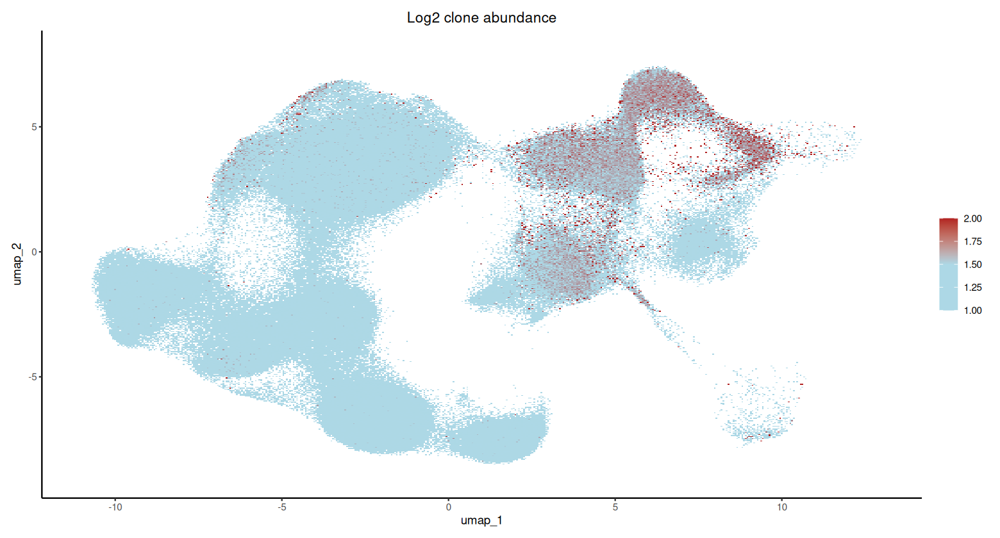

In [158]:
FeaturePlot(subset(gut_allt_integrated, clone_abundance >=1 & clone_abundance < 2000), 
            reduction = "umap", features = "log_clone_abundance", 
            cols = c("lightblue","lightblue","firebrick"), max.cutoff = 6) + 
theme_classic() + theme(plot.title = element_text(hjust = 0.5)) + ggtitle("Log2 clone abundance")

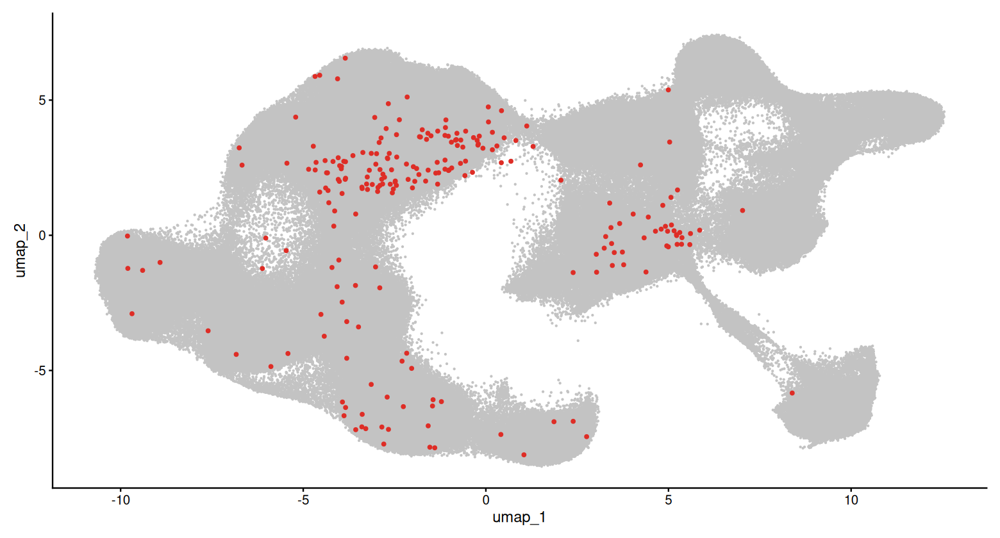

In [159]:
gut_allt_integrated$inkt  <- ifelse(gut_allt_integrated$v_gene_A1 == "TRAV10" & gut_allt_integrated$j_gene_A1 == "TRAJ18","TRAV10-TRAJ18","Other")

DimPlot(gut_allt_integrated, raster = F,  
                 cells.highlight = colnames(gut_allt_integrated)[grep(gut_allt_integrated$inkt, pattern = "TRAV10-TRAJ18")]) +NoLegend()

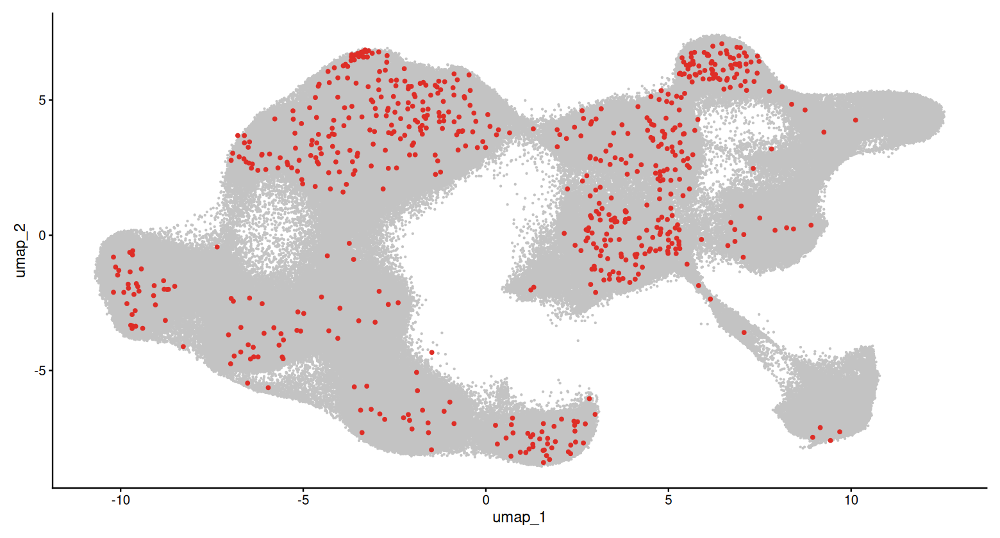

In [160]:
gut_allt_integrated$mait  <- ifelse(gut_allt_integrated$v_gene_A1 == "TRAV1-2" & gut_allt_integrated$j_gene_A1 == "TRAJ33","TRAV1-2-TRAJ33","Other")

DimPlot(gut_allt_integrated, raster = F,  
                 cells.highlight = colnames(gut_allt_integrated)[grep(gut_allt_integrated$mait, pattern = "TRAV1-2-TRAJ33")]) +NoLegend()

## Cluster PCA

In [18]:
ls()

[1] "genes.blocklist"   "ggtheme"           "gut_3p_cd4"       
[4] "gut_3p_integrated" "merged_ds"         "merged.list"